Note: due to folder reorganization it could be that this notebook is not working properly. If so, please adjust the file paths. Future todo: central module containing all paths.

In [1]:
import pandas as pd
import statsmodels.api as sm
import statsmodels.graphics as smg
import json
import matplotlib.pyplot as plt
import os
from tqdm import tqdm
import math
import numpy as np
import warnings

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)
pd.set_option('display.colheader_justify', 'center')
pd.set_option('display.precision', 3)


## Load Data

### Migration influx

In [2]:
with open("../../migration_rates/countries.json") as buf:
    countries = list(json.load(buf).keys())

df_all = pd.read_csv(
    "../../migration_rates/migration_rate_processed.csv", index_col=0, parse_dates=["date"]
)
df_all.set_index("date", inplace=True)
df_all["value"] = pd.to_numeric(df_all["value"], errors="coerce")

for c in countries:
    df_all.loc[df_all["country"] == c, "value"].fillna(
        df_all.loc[df_all["country"] == c].mean(), inplace=True
    )  # fill missing data with mean

series = {c: df_all[df_all.country == c].value for c in countries}
series["NL"]


FileNotFoundError: [Errno 2] No such file or directory: '../migration_rates/countries.json'

### Google trends

In [3]:
DATA_VERSION = "21-04-22"

LANGUAGE_ASSIGNMENT_FILE = "../keywords/assignment_language_country.json"


def get_input_file(country: str) -> str:
    directory = f"../processed_data/{DATA_VERSION}"
    if not os.path.exists(directory):
        os.makedirs(directory)
    return os.path.join(directory, f"processed_{country}.csv")


with open(LANGUAGE_ASSIGNMENT_FILE) as f:
    assignment_language_country = json.load(f)

dataframes = {
    c: pd.read_csv(get_input_file(c), header=[0, 1], index_col=0, parse_dates=[0])
    for c in countries
}

keyword_ids = dataframes[countries[0]]["mean"].columns.to_list()
dataframes["NL"].head()


mean                                                                                                                                                                                                                                                                                                                                                                              sem                                                                                                                                                                                                                                                                                                                                                            
keyword_id    2       10      11      12      14      15      16      17      18      19      20      21     22     24      26    28    32     33      37      38    39   41     42      43      44      48      49      51      52      54      55      56      57      58      59      60     112     113     114     115     117     118     119     121     122     123     124     125     2       10      11      12     14      15      16      17      18     19     20     21      22     24      26    28    32      33      37      38    39   41     42      43      44      48      49      51     52      54     55      56      57      58      59     60    112    113    114    115    117    118    119    121    122    123    124    125  
date                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          
2007-01-01  12.143   7.143  20.714   0.000  19.429  66.143   0.000   0.000  34.143  28.143  56.143  27.286   0.0  28.286  47.143  0.0   0.0   0.000  29.714  21.286  0.0  0.0  33.571  49.000  31.143   0.000  60.429   0.000  37.286   0.000  44.143  23.000  19.857   0.000  27.286   7.286  78.000  36.857  61.286  83.286  56.714  43.429  87.571  71.143  52.429  57.143  60.000  25.571  5.742   7.143   9.788   0.000  6.941  12.023   0.000   0.000  17.141  5.462  5.990  9.020   0.000  8.909  10.173  0.0  0.000   0.000   8.742  13.751  0.0  0.0   7.979  12.490   8.166   0.000   6.750   0.000  6.050   0.000  0.459  10.994  11.319   0.000  13.083  4.704  2.573  3.262  0.747  4.839  4.922  1.270  1.131  1.243  2.918  1.056  0.926  0.481
2007-02-01   0.000   0.000  56.857   0.000   0.000  54.429  23.857  36.000   0.000  32.000  22.429  30.429   0.0  42.571   7.429  0.0  12.0   0.000   0.000  33.000  0.0  0.0   8.714  57.000  55.571   7.286  54.857  16.857  27.000   0.000  42.429  31.286  37.571   0.000   0.000   0.000  69.429  30.857  63.714  40.714  60.571  45.429  84.143  68.429  47.857  57.857  57.571  21.429  0.000   0.000  12.314   0.000  0.000  14.777  11.897  13.454   0.000  5.876  7.221  7.207   0.000  9.668   4.815  0.0  7.758   0.000   0.000  15.677  0.0  0.0   5.651   9.477  13.210   7.286  11.241  11.098  5.477   0.000  0.369  11.353   8.737   0.000   0.000  0.000  4.174  4.585  0.918  2.542  1.784  2.308  0.962  1.360  3.508  1.317  1.192  0.612
2007-03-01   0.000  72.000   0.000  44.571  13.143  42.143   0.000  36.429   0.000  37.286  16.714  69.143   0.0  23.286  30.429  0.0   0.0  40.286  51.143   0.000  0.0  0.0  28.429   9.571   0.000  38.714  24.000   0.000  17.286  28.714  40.429  14.714   7.286   0.000  51.571  19.857  61.571  33.714  57.429  63.429  55.000  40.857  84.

### Macroeconomics

In [4]:
def read_gdp(filename, country_names, skiprows=10, nrows=38):
    df = pd.read_excel(filename, skiprows=skiprows, nrows=nrows)

    country_names_inv = {v: k for k, v in country_names.items()}

    df = (
        df[df["GEO/TIME"].isin(country_names.values())]
        .replace(country_names_inv)
        .set_index("GEO/TIME")
        .transpose()
        .stack()
        .reset_index(level=[1])
        .rename(columns={0: "gdp", "GEO/TIME": "country"})
    )
    df.index = pd.to_datetime(df.index)
    return df


def read_unempl(filename, country_names, skiprows=10, nrows=29):
    df = pd.read_excel(filename, skiprows=skiprows, nrows=nrows, sheet_name="Sheet 1")

    country_names_inv = {v: k for k, v in country_names.items()}

    df = (
        df.drop(columns=df.filter(like="Unnamed"), index=0)
        .loc[df["TIME"].isin(country_names.values())]
        .replace(country_names_inv)
        .set_index("TIME")
        .transpose()
        .stack()
        .reset_index(level=[1])
        .rename(columns={0: "unempl", "TIME": "country"})
        .replace({":": np.nan})
    )

    df.index = pd.to_datetime(df.index)
    return df


def read_share_young_pop(filename, country_names, skiprows=9, nrows=29):
    df = pd.read_excel(filename, skiprows=skiprows, nrows=nrows, sheet_name="Share Young Pop")

    country_names_inv = {v: k for k, v in country_names.items()}

    df = (
        df.drop(columns=df.filter(like="Unnamed"), index=0)
        .loc[df["TIME"].isin(country_names.values())]
        .replace(country_names_inv)
        .set_index("TIME")
        .transpose()
        .stack()
        .reset_index(level=[1])
        .rename(columns={0: "share_young_pop", "TIME": "country"})
    )

    df.index = pd.to_datetime(df.index)
    return df


with open("../macroeconomics/country_names.json") as f:
    country_names = json.load(f)

df_gdp = read_gdp("../macroeconomics/GDP_pc_quart.xls", country_names)
df_unempl = read_unempl("../macroeconomics/Unemployment_Rate_Quart.xlsx", country_names)
df_share_young_pop = read_share_young_pop("../macroeconomics/Share_Young_Population.xlsx", country_names)
df_share_young_pop
# df_unempl


,country,share_young_pop
2004-01-01,BE,0.184
2004-01-01,BG,0.210
2004-01-01,CZ,0.226
2004-01-01,DK,0.176
2004-01-01,EE,0.218
2004-01-01,IE,0.238
2004-01-01,GR,0.210
2004-01-01,ES,0.215
2004-01-01,FR,0.192
2004-01-01,HR,0.196


## Resample, transform and merge

In [5]:
dfs_3m = {k: df.resample("3M").mean() for k, df in dataframes.items()}
sers_3m = {k: df.resample("3M").mean() for k, df in series.items()}

dfs_trans = {
    k: ((df - df.shift(4)) / df.mean()).fillna(0) for k, df in dfs_3m.items()
}
sers_trans = {
    k: ((df - df.shift(4)) / df.shift(4)).fillna(0) for k, df in sers_3m.items()
}

tmp_dfs = []

for c in countries:
    tmp_dep = (
        sers_trans[c]
        .to_frame()
        .assign(country=c)
        .assign(month=sers_trans[c].index.month.astype(str))
    )
    ar_1 = sers_trans[c].shift(1).rename("ar_1")
    tmp_ind_1 = dfs_trans[c]["mean"].shift(1).rename(columns=lambda x: x + "_1")
    tmp_ind_2 = dfs_trans[c]["mean"].shift(2).rename(columns=lambda x: x + "_2")
    tmp_ind_3 = dfs_trans[c]["mean"].shift(3).rename(columns=lambda x: x + "_3")
    tmp_ind_4 = dfs_trans[c]["mean"].shift(4).rename(columns=lambda x: x + "_4")
    tmp_df = pd.concat([tmp_dep, tmp_ind_1, tmp_ind_2, tmp_ind_3, tmp_ind_4, ar_1], axis=1)[
        "2010-12-31":"2019-12-31"
    ]
    tmp_dfs.append(tmp_df)

df_panel_1y = pd.concat(tmp_dfs).sort_index()

# for df in [df_share_young_pop, df_gdp, df_unempl]:
#     df_tmp = (
#         df.groupby([pd.Grouper(freq="1M"), "country"]).mean().shift(12).pct_change()
#     )
#     df_panel_1y = df_panel_1y.join(
#         df_tmp, on=[df_panel_1y.index, df_panel_1y["country"]], how="left"
#     )

df_panel_1y


,value,country,month,2_1,10_1,11_1,12_1,14_1,15_1,16_1,17_1,18_1,19_1,20_1,21_1,22_1,24_1,26_1,28_1,32_1,33_1,37_1,38_1,39_1,41_1,42_1,43_1,44_1,48_1,49_1,51_1,52_1,54_1,55_1,56_1,57_1,58_1,59_1,60_1,112_1,113_1,114_1,115_1,117_1,118_1,119_1,121_1,122_1,123_1,124_1,125_1,2_2,10_2,11_2,12_2,14_2,15_2,16_2,17_2,18_2,19_2,20_2,21_2,22_2,24_2,26_2,28_2,32_2,33_2,37_2,38_2,39_2,41_2,42_2,43_2,44_2,48_2,49_2,51_2,52_2,54_2,55_2,56_2,57_2,58_2,59_2,60_2,112_2,113_2,114_2,115_2,117_2,118_2,119_2,121_2,122_2,123_2,124_2,125_2,2_3,10_3,11_3,12_3,14_3,15_3,16_3,17_3,18_3,19_3,20_3,21_3,22_3,24_3,26_3,28_3,32_3,33_3,37_3,38_3,39_3,41_3,42_3,43_3,44_3,48_3,49_3,51_3,52_3,54_3,55_3,56_3,57_3,58_3,59_3,60_3,112_3,113_3,114_3,115_3,117_3,118_3,119_3,121_3,122_3,123_3,124_3,125_3,2_4,10_4,11_4,12_4,14_4,15_4,16_4,17_4,18_4,19_4,20_4,21_4,22_4,24_4,26_4,28_4,32_4,33_4,37_4,38_4,39_4,41_4,42_4,43_4,44_4,48_4,49_4,51_4,52_4,54_4,55_4,56_4,57_4,58_4,59_4,60_4,112_4,113_4,114_4,115_4,117_4,118_4,119_4,121_4,122_4,123_4,124_4,125_4,ar_1
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-01-31,-6.924e-02,FR,1,-1.056,1.084e+00,-1.101e+00,4.004e-01,-0.253,0.105,-0.461,-1.163e+00,0.000e+00,4.283e-02,1.934e-01,3.851e-01,0.326,1.033e-01,-0.496,0.000e+00,-0.056,0.745,-0.459,-0.459,0.000,-5.826e-01,-0.012,-1.068e-01,0.543,0.178,-0.078,-0.498,-0.196,-0.631,-1.728e-02,0.141,0.006,0.370,0.393,-0.243,-2.881e-02,-0.277,3.816e-02,-3.239e-02,7.520e-02,-5.749e-02,1.802e-01,-3.668e-02,-5.118e-02,-1.228e-01,6.456e-02,2.004e-01,-0.555,-3.919e-01,-3.507e-01,0.000e+00,0.719,0.009,-0.282,-8.617e-02,0.000e+00,-1.161e-01,-9.237e-01,3.919e-01,-0.328,2.147e-01,0.194,0.000e+00,0.467,0.217,-0.226,0.055,0.000,4.502e-01,0.162,2.984e-01,-0.440,0.861,-0.428,0.398,-0.747,1.232,4.714e-01,0.203,-0.253,0.220,0.212,-0.252,6.338e-02,0.049,-3.330e-02,-1.425e-01,-2.266e-02,-1.911e-01,2.163e-01,-2.889e-01,-0.010,-1.166e-01,6.876e-02,1.512e-01,0.597,1.491e-01,2.664e-01,4.077e-01,1.035,-0.553,-0.192,5.109e-01,0.000e+00,-5.072e-02,4.342e-02,-1.135e-01,0.501,1.767e-01,0.380,0.000e+00,-0.027,0.919,0.530,0.594,0.000,5.439e-01,0.380,2.697e-01,0.144,-0.031,-0.643,0.016,0.349,0.358,5.183e-02,0.061,0.007,0.154,0.191,-0.017,-3.841e-03,1.880e-01,-5.342e-02,-3.206e-01,-2.328e-01,-2.979e-01,3.641e-01,-1.422e-01,-0.034,-1.665e-01,4.444e-02,1.409e-01,0.075,-2.215e-01,4.738e-01,-9.706e-02,0.943,-0.445,0.431,-4.001e-01,0.000e+00,2.198e-01,-2.013e-01,-1.919e-01,-0.312,0.094,0.045,0.000e+00,1.328,0.041,0.085,0.235,0.000,3.483e-01,0.692,2.228e-01,0.217,0.668,0.096,-0.366,-0.503,1.137,1.135e-01,-0.219,-0.192,0.209,-0.441,0.044,2.113e-02,1.467e-01,-3.677e-02,-1.555e-01,-3.533e-01,-1.501e-01,4.845e-01,-3.210e-02,-0.062,-1.332e-01,1.929e-02,8.590e-02,0.000e+00
2011-01-31,-1.091e-01,FI,1,0.000,0.000e+00,0.000e+00,0.000e+00,0.000,0.000,0.000,0.000e+00,0.000e+00,2.576e-01,0.000e+00,-8.949e-01,0.297,-5.217e-01,-0.169,0.000e+00,0.000,0.000,-1.082,0.000,0.000,0.000e+00,0.000,1.034e+00,0.000,0.000,0.000,0.000,0.000,0.000,-1.632e-01,0.000,0.000,0.000,0.000,0.000,1.862e-01,-0.024,2.254e-02,3.941e-02,3.174e-01,8.773e-02,9.984e-02,-7.583e-04,3.041e-02,3.265e-02,1.355e-01,3.477e-01,0.000,0.000e+00,0.000e+00,0.000e+00,0.000,0.000,0.000,0.000e+00,0.000e+00,-5.588e-01,0.000e+00,1.325e+00,0.000,1.081e+00,0.692,0.000e+00,0.000,0.000,0.393,0.000,0.000,0.000e+00,0.000,-1.398e+00,0.000,0.000,0.000,0.000,0.000,0.000,3.519e-01,0.000,0.000,0.000,0.000,0.000,4.126e-01,-0.044,-1.176e-02,-4.903e-01,-2.063e-01,-1.189e-01,9.539e-03,3.943e-02,0.110,1.322e-01,1.624e-01,3.254e-01,0.000,0.000e+00,0.000e+00,0.000e+00,0.000,0.000,0.000,0.000e+00,0.000e+00,-6.630e-02,0.000e+00,3.040e-01,-1.069,5.325e-01,0.253,0.000e+00,0.000,0.000,-0.780,0.000,0.000,0.000e+00,0.000,0.000e+00,0.000,0.000,0.000,0.000,0.000,0.000,1.734e-02,0.000,0.000,0.000,0.000,0.000,-4.136e-01,5.988e-03,-4.096e-01,1.240e-01,-2.78

## Evaluation functions and common variables

In [6]:
from sklearn import linear_model
from sklearn import model_selection
from sklearn import ensemble
from sklearn import metrics
from sklearn import pipeline
from sklearn import preprocessing
from sklearn import svm
from sklearn import decomposition
from sklearn import discriminant_analysis
from sklearn import feature_selection
from sklearn import compose
from sklearn import impute
from sklearn import dummy
from sklearn import neural_network

t_min = "2011-01-01"
t_max = "2019-12-01"
t_split_lower = "2017-12-01"
t_split_upper = "2018-01-01"

scoring = ["neg_mean_absolute_percentage_error", "neg_root_mean_squared_error", "r2"]

# selected_countries = ["FR", "GB", "IT", "ES", "RO"]
selected_countries = countries


df_panel_1y = df_panel_1y[df_panel_1y.country.isin(selected_countries)]

dummies_country = pd.get_dummies(df_panel_1y["country"], drop_first=False)
dummy_cols = dummies_country.columns.tolist()

dummies_month = pd.get_dummies(df_panel_1y["month"], prefix="month", drop_first=False)
dummy_cols_month = dummies_month.columns.tolist()

df_tmp_combined = df_panel_1y["country"] + "_" + df_panel_1y["month"]
dummies_combined = pd.get_dummies(df_tmp_combined, drop_first=False)
dummy_cols_combined = dummies_combined.columns.tolist()

df_panel_1y = pd.concat(
    [df_panel_1y, dummies_country, dummies_month, dummies_combined], axis=1
)

x = df_panel_1y.drop(columns="value")[t_min:t_max]
y = df_panel_1y["value"][t_min:t_max]

x_train = x[t_min:t_split_lower]
y_train = y[t_min:t_split_lower]
x_test = x[t_split_upper:t_max]
y_test = y[t_split_upper:t_max]


def score_cv(reg, X, y):
    scores = model_selection.cross_validate(reg, X=X, y=y, scoring=scoring)
    return pd.DataFrame(scores)


def score_test(reg, X, y):
    scores = {s: metrics.get_scorer(s)(reg, X, y) for s in scoring}
    return pd.Series(scores)


def plot_panel(df, countries, n_rows=7, n_cols=4, figsize=(25, 25), autoscale=True):
    fig, axs = plt.subplots(n_rows, n_cols, figsize=figsize)
    for c, ax in zip(countries, axs.flatten()):
        df_to_plot = df[df["country"] == c].drop(columns="country")
        if autoscale is not None:
            y_max = max([df_to_plot[col].max() for col in df_to_plot.columns])
            y_min = min([df_to_plot[col].min() for col in df_to_plot.columns])
        df_to_plot.plot(ax=ax, ylim=(y_min * 1.2, y_max * 1.2) if autoscale else None)
        ax.set_title(c)
    fig.tight_layout()
    return fig, axs


def plot_prediction(reg, X, countries=selected_countries, **kwargs):
    y_pred = reg.predict(X)
    df_pred = df_panel_1y[["value", "country"]][t_min:t_max].assign(pred=y_pred)
    return plot_panel(df_pred, countries, **kwargs)


def plot_residuals(reg, X, countries=selected_countries, **kwargs):
    y_pred = reg.predict(X)
    df_pred = df_panel_1y[["value", "country"]][t_min:t_max].assign(pred=y_pred)
    df_pred["residuals"] = df_pred["pred"] - df_pred["value"]
    return plot_panel(df_pred[["residuals", "country"]], countries, **kwargs)



## Models

### const baseline

,fit_time,score_time,test_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,test_r2
0,0.011,0.002,-0.993,-0.416,-0.835
1,0.002,0.002,-1.000,-0.244,-0.324
2,0.008,0.003,-1.000,-0.337,-0.090
3,0.002,0.002,-1.000,-0.124,-0.007
4,0.008,0.002,-1.000,-0.108,-0.195


Mean CV score:


fit_time                                   0.006
score_time                                 0.002
test_neg_mean_absolute_percentage_error   -0.999
test_neg_root_mean_squared_error          -0.246
test_r2                                   -0.290
dtype: float64

OOS score:


neg_mean_absolute_percentage_error   -0.991
neg_root_mean_squared_error          -0.099
r2                                   -0.014
dtype: float64

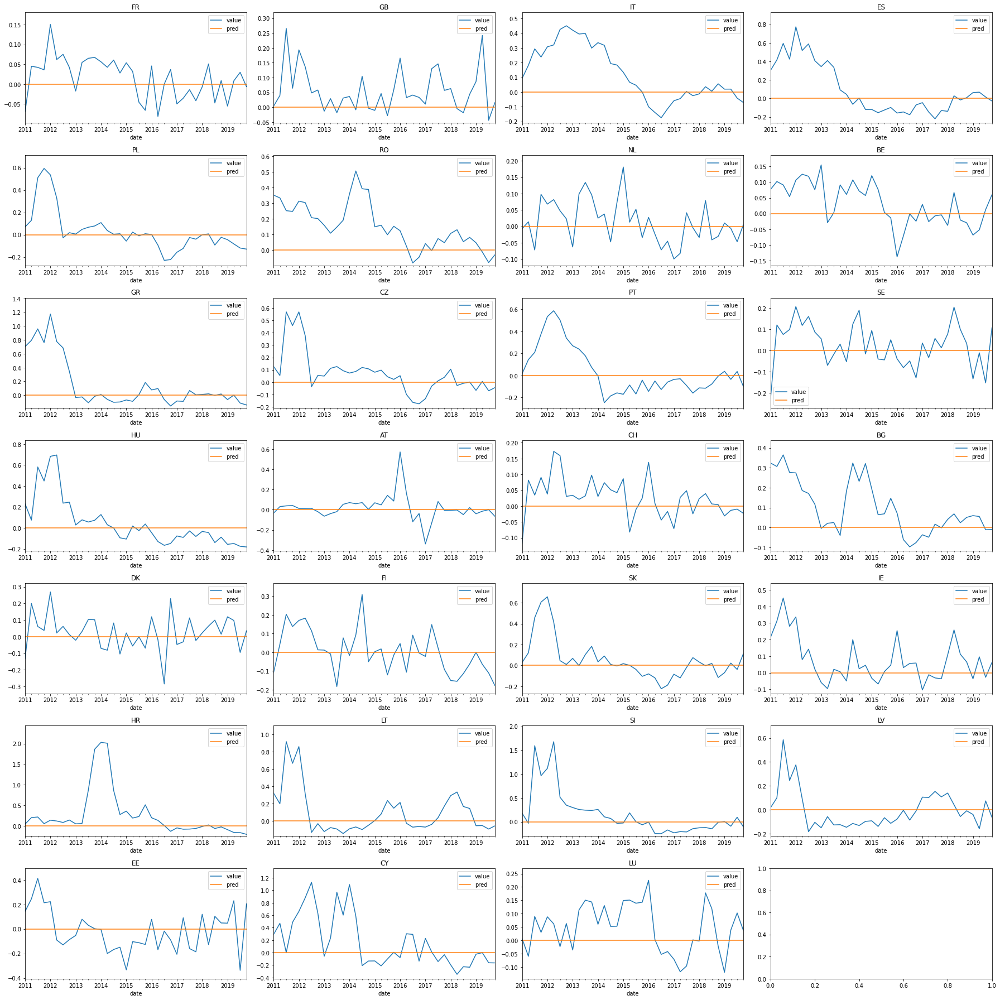

In [7]:
features = dummy_cols

reg = dummy.DummyRegressor(strategy="constant", constant=0.0)

reg.fit(x_train[features], y_train)

cv_score = score_cv(reg, x_train[features], y_train)
display(cv_score)
print("Mean CV score:")
display(cv_score.mean())
print("OOS score:")
test_score = score_test(reg, x_test[features], y_test)
display(test_score)
fig, axs = plot_prediction(reg, x[features])


### country dummies

,fit_time,score_time,test_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,test_r2
0,0.010,0.007,-6.713e+12,-0.401,-0.704
1,0.005,0.005,-2.271e+00,-0.207,0.047
2,0.004,0.006,-4.385e+00,-0.319,0.023
3,0.011,0.004,-1.351e+01,-0.187,-1.319
4,0.007,0.005,-6.308e+00,-0.236,-4.701


Mean CV score:


fit_time                                   7.519e-03
score_time                                 5.576e-03
test_neg_mean_absolute_percentage_error   -1.343e+12
test_neg_root_mean_squared_error          -2.702e-01
test_r2                                   -1.331e+00
dtype: float64

OOS score:


neg_mean_absolute_percentage_error   -6.495e+12
neg_root_mean_squared_error          -1.824e-01
r2                                   -2.451e+00
dtype: float64

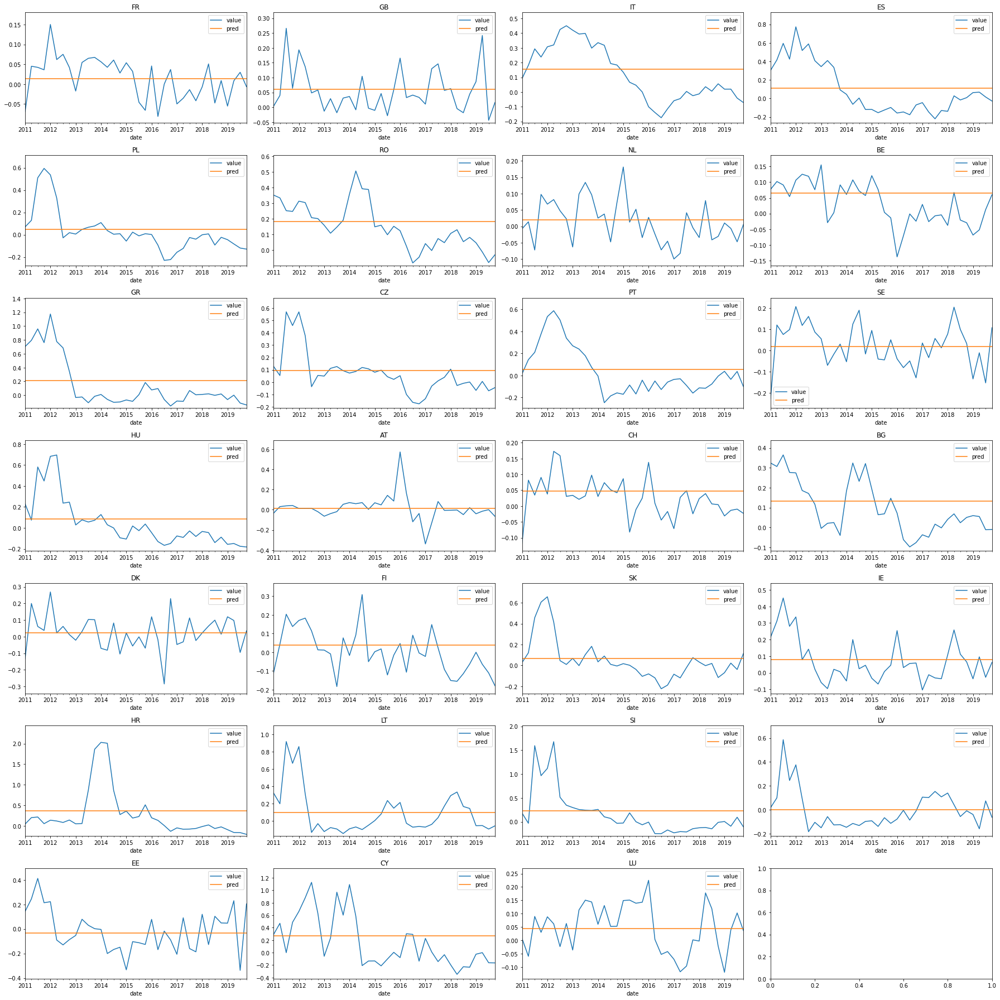

In [8]:
features = dummy_cols

reg = linear_model.LinearRegression()

reg.fit(x_train[features], y_train)

cv_score = score_cv(reg, x_train[features], y_train)
display(cv_score)
print("Mean CV score:")
display(cv_score.mean())
print("OOS score:")
test_score = score_test(reg, x_test[features], y_test)
display(test_score)
fig, axs = plot_prediction(reg, x[features])



### ar(1)

,fit_time,score_time,test_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,test_r2
0,0.006,0.007,-9.845e+12,-0.260,0.282
1,0.005,0.014,-1.694e+00,-0.170,0.357
2,0.009,0.010,-1.940e+00,-0.175,0.706
3,0.013,0.016,-4.625e+00,-0.110,0.204
4,0.016,0.004,-3.675e+00,-0.102,-0.055


Mean CV score:


fit_time                                   9.983e-03
score_time                                 1.026e-02
test_neg_mean_absolute_percentage_error   -1.969e+12
test_neg_root_mean_squared_error          -1.633e-01
test_r2                                    2.989e-01
dtype: float64

OOS score:


neg_mean_absolute_percentage_error   -1.438e+12
neg_root_mean_squared_error          -9.488e-02
r2                                    6.628e-02
dtype: float64

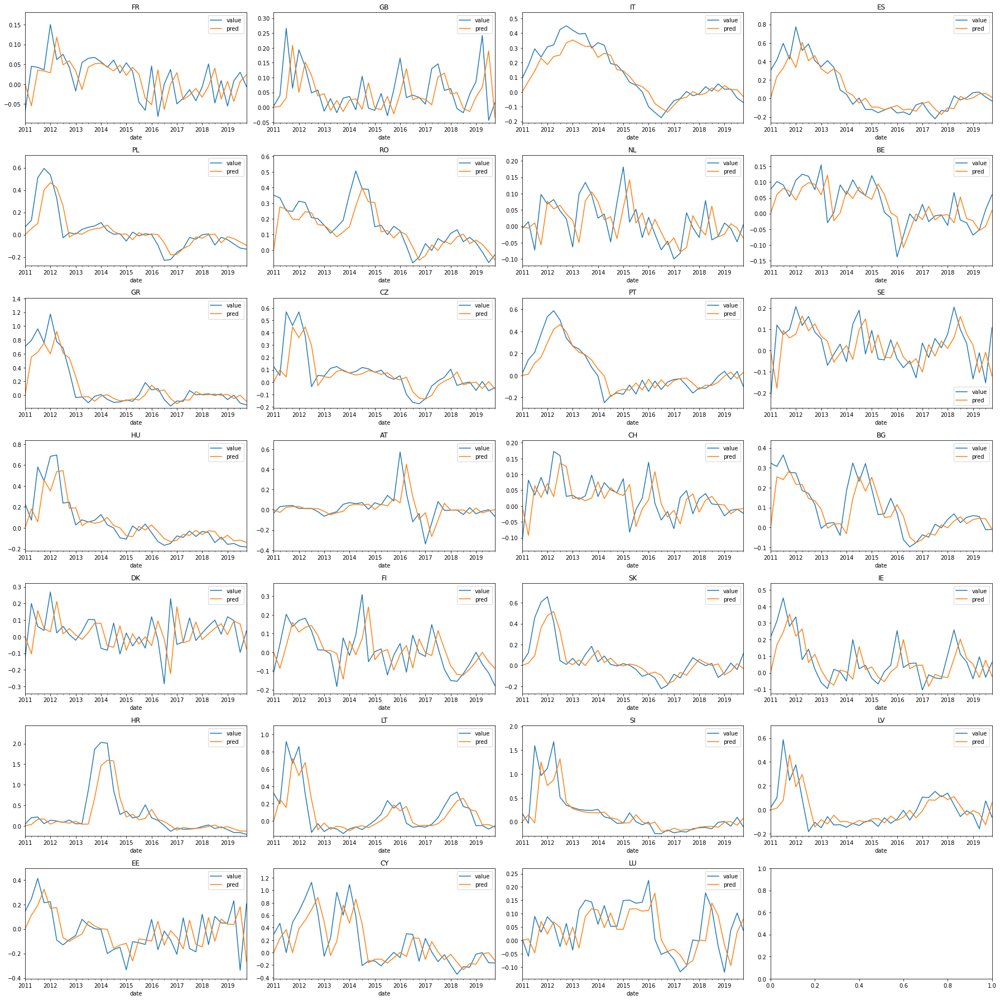

In [9]:
features = ["ar_1"]

reg = linear_model.LinearRegression(fit_intercept=False)

reg.fit(x_train[features], y_train)

cv_score = score_cv(reg, x_train[features], y_train)
display(cv_score)
print("Mean CV score:")
display(cv_score.mean())
print("OOS score:")
test_score = score_test(reg, x_test[features], y_test)
display(test_score)
fig, axs = plot_prediction(reg, x[features])



### kw 19

,fit_time,score_time,test_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,test_r2
0,0.007,0.015,-2.611e+12,-0.379,-0.524
1,0.011,0.004,-1.954e+00,-0.229,-0.170
2,0.011,0.004,-3.318e+00,-0.328,-0.035
3,0.004,0.006,-6.516e+00,-0.114,0.147
4,0.007,0.005,-3.317e+00,-0.107,-0.169


Mean CV score:


fit_time                                   8.031e-03
score_time                                 6.813e-03
test_neg_mean_absolute_percentage_error   -5.222e+11
test_neg_root_mean_squared_error          -2.315e-01
test_r2                                   -1.502e-01
dtype: float64

OOS score:


neg_mean_absolute_percentage_error   -3.802e+12
neg_root_mean_squared_error          -1.077e-01
r2                                   -2.033e-01
dtype: float64

19_1    0.118
19_2    0.054
19_3    0.054
19_4    0.060
dtype: float64

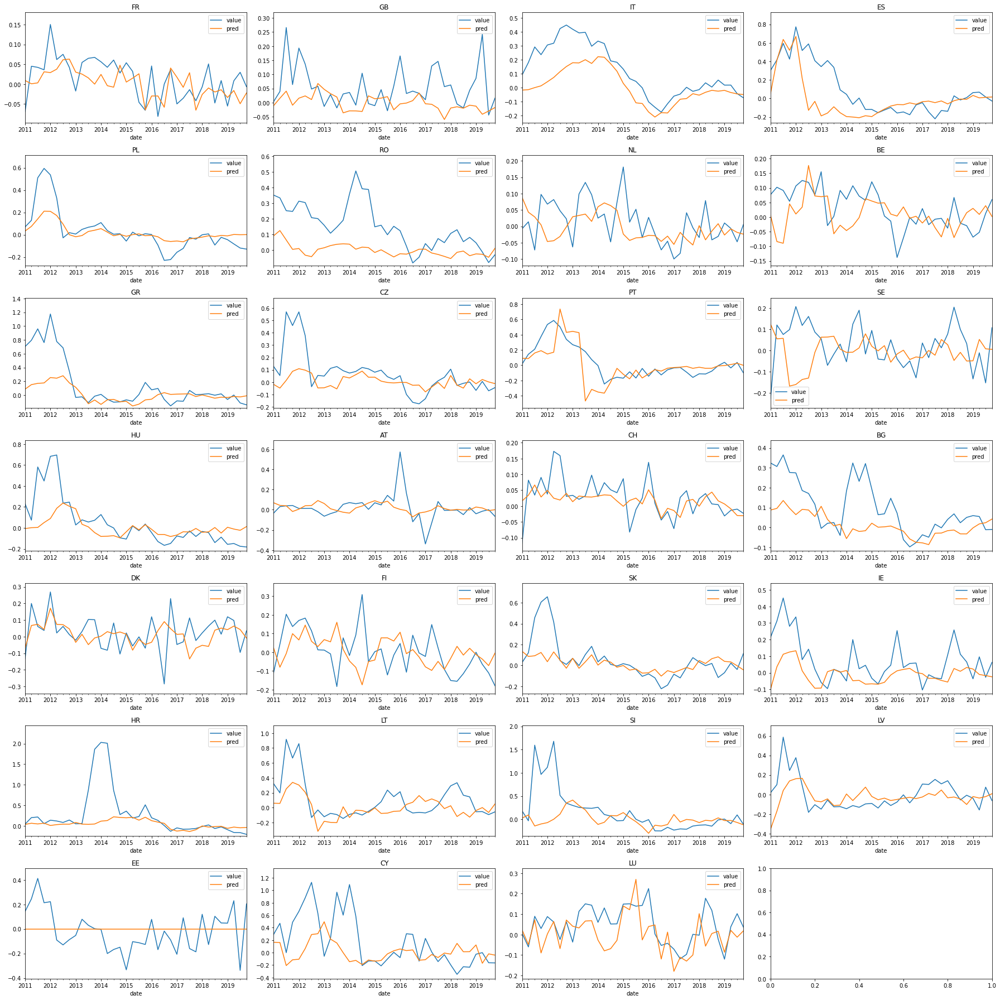

In [10]:
features = ["19_1", "19_2", "19_3", "19_4"]

reg = linear_model.LinearRegression(fit_intercept=False)

# reg = ensemble.GradientBoostingRegressor()

reg.fit(x_train[features], y_train)

cv_score = score_cv(reg, x_train[features], y_train)
display(cv_score)
print("Mean CV score:")
display(cv_score.mean())
print("OOS score:")
test_score = score_test(reg, x_test[features], y_test)
display(test_score)

display(pd.Series(reg.coef_, index=features))

fig, axs = plot_prediction(reg, x[features])



### all keywords, lasso

/home/stei509/anaconda3/envs/eumf/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/home/stei509/anaconda3/envs/eumf/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/home/stei509/anaconda3/envs/eumf/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.793216350688255, tolerance: 0.0030194394744712653
  model = cd_fast.enet_coordinate_descent(
/home/stei509/anaconda3/envs/eumf/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: UserWarning: With alpha=0, this algorit

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.209,5.073e-02,0.009,1.502e-03,0.0,-0.401,-0.221,-0.340,-0.136,-0.164,-0.252,0.102,15
1,0.012,2.153e-03,0.005,5.336e-04,0.0,-0.401,-0.221,-0.340,-0.136,-0.164,-0.252,0.102,14
2,0.015,3.605e-03,0.008,3.366e-03,0.0,-0.401,-0.221,-0.340,-0.136,-0.164,-0.252,0.102,13
3,0.021,5.020e-03,0.015,2.938e-03,0.0,-0.400,-0.220,-0.339,-0.135,-0.162,-0.251,0.102,12
4,0.016,3.087e-03,0.011,1.854e-03,0.001,-0.396,-0.219,-0.332,-0.125,-0.147,-0.244,0.105,4
5,0.018,2.240e-03,0.012,4.197e-03,0.01,-0.390,-0.223,-0.327,-0.109,-0.104,-0.231,0.115,1
6,0.012,3.338e-03,0.008,1.265e-03,0.002,-0.393,-0.219,-0.327,-0.118,-0.134,-0.238,0.107,3
7,0.014,3.702e-03,0.006,1.665e-03,0.005,-0.385,-0.220,-0.326,-0.112,-0.113,-0.231,0.111,2
8,0.011,1.474e-03,0.007,1.338e-03,0.1,-0.416,-0.244,-0.337,-0.124,-0.108,-0.246,0.119,5
9,0.011,2.178e-03,0.007,1.038e-03,0.2,-0.416,-0.244,-0.337,-0.124,-0.108,-0.246,0.119,5


LASSO Coefficients:
19_1     0.090
19_3     0.040
19_4     0.037
19_2     0.037
24_1     0.025
24_2     0.010
24_3     0.010
21_4     0.008
12_2     0.007
12_1     0.001
21_2     0.001
121_3    0.000
114_3    0.000
57_3     0.000
58_3     0.000
59_3     0.000
60_3     0.000
112_3    0.000
113_3    0.000
117_3    0.000
115_3    0.000
124_3    0.000
118_3    0.000
55_3     0.000
123_3    0.000
119_3    0.000
122_3    0.000
56_3     0.000
2_1      0.000
54_3     0.000
33_3     0.000
16_3     0.000
17_3     0.000
18_3     0.000
20_3     0.000
21_3     0.000
22_3     0.000
26_3     0.000
28_3     0.000
32_3     0.000
37_3     0.000
52_3     0.000
38_3     0.000
39_3     0.000
41_3     0.000
42_3     0.000
43_3     0.000
44_3     0.000
48_3     0.000
49_3     0.000
125_3    0.000
51_3     0.000
11_4     0.000
2_4      0.000
112_4    0.000
51_4     0.000
52_4     0.000
54_4     0.000
55_4     0.000
56_4     0.000
57_4     0.000
58_4     0.000
59_4     0.000
60_4     0.000
113_4    0.000
10_4 

,fit_time,score_time,test_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,test_r2
0,0.014,0.017,-9.473e+11,-0.390,-0.609
1,0.009,0.007,-1.784e+00,-0.223,-0.110
2,0.011,0.008,-2.869e+00,-0.327,-0.028
3,0.012,0.012,-5.069e+00,-0.109,0.218
4,0.011,0.015,-2.318e+00,-0.104,-0.093


Mean CV score:


fit_time                                   1.130e-02
score_time                                 1.191e-02
test_neg_mean_absolute_percentage_error   -1.895e+11
test_neg_root_mean_squared_error          -2.305e-01
test_r2                                   -1.245e-01
dtype: float64

OOS score:


neg_mean_absolute_percentage_error   -3.304e+12
neg_root_mean_squared_error          -1.061e-01
r2                                   -1.669e-01
dtype: float64

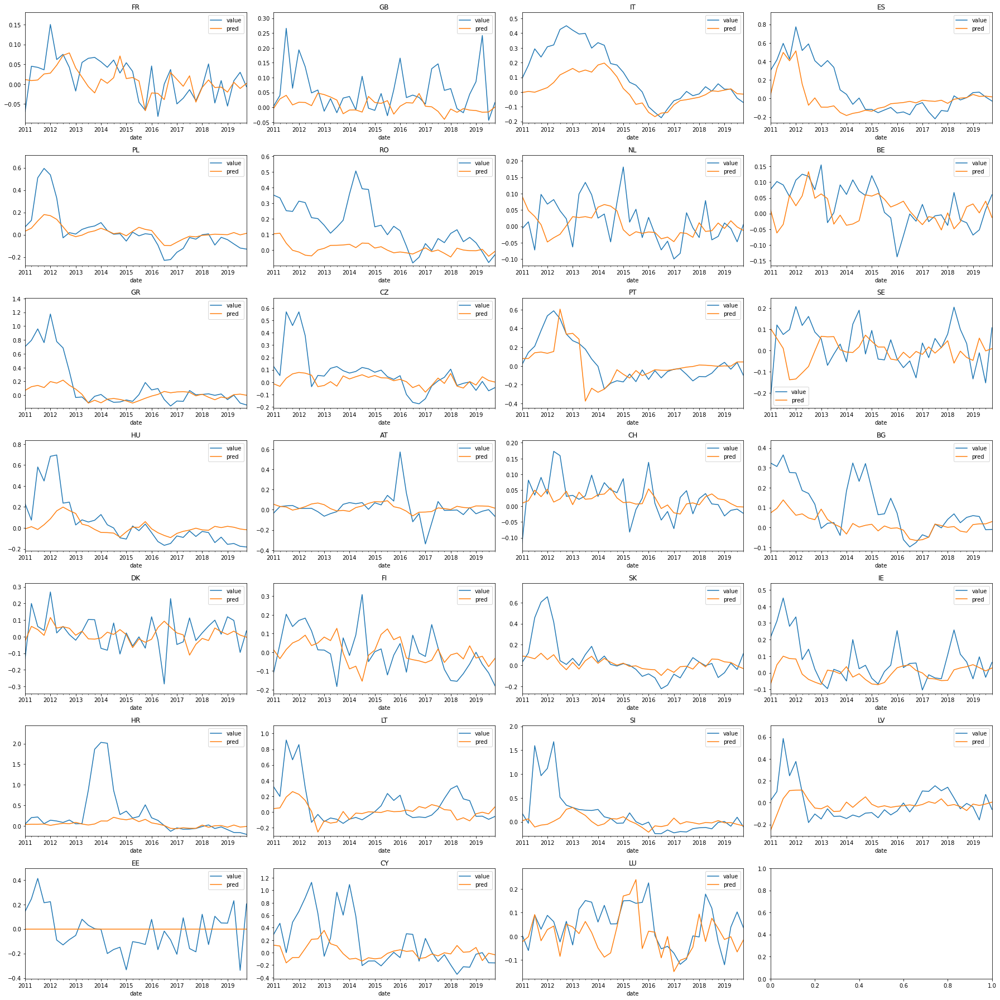

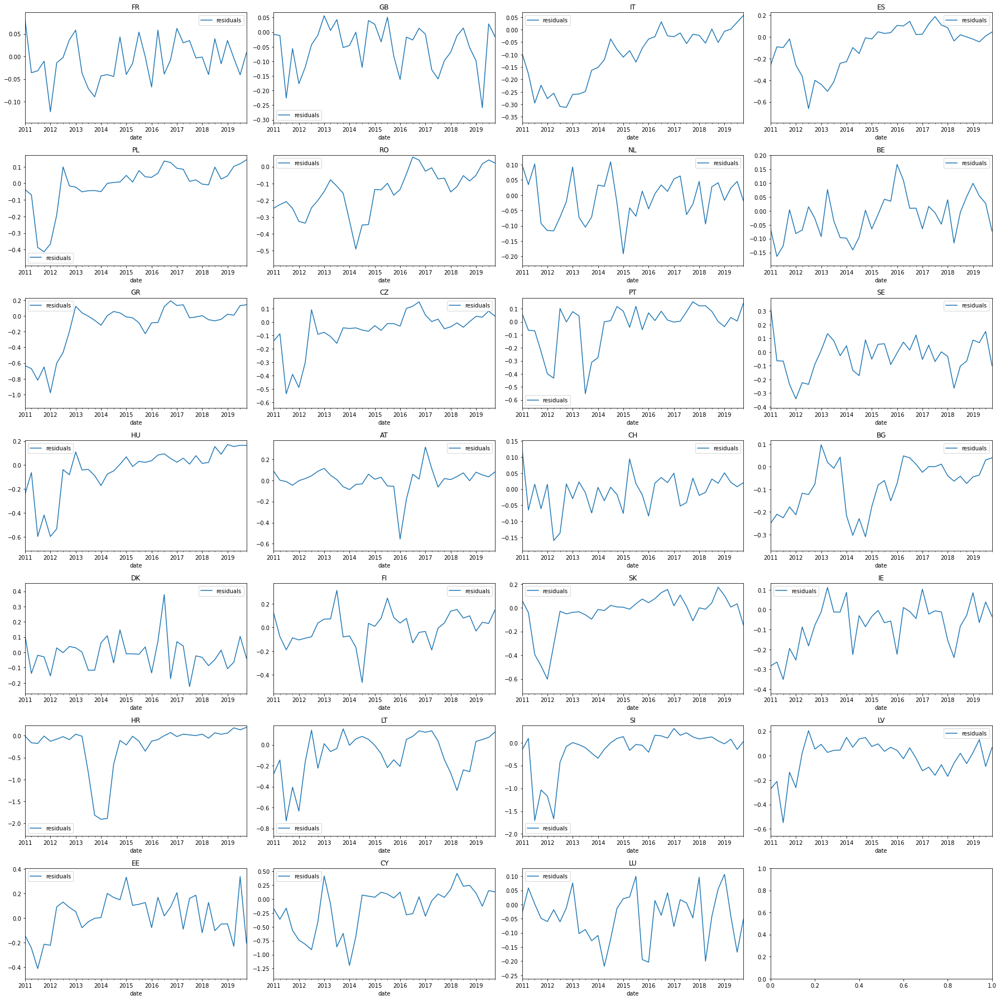

In [11]:
features = (
    [k + "_1" for k in keyword_ids]
    + [k + "_2" for k in keyword_ids]
    + [k + "_3" for k in keyword_ids]
    + [k + "_4" for k in keyword_ids]
)

# reg = linear_model.Lasso(positive=True, normalize=True, alpha=10.0)
reg_unfitted = linear_model.Lasso(normalize=False, positive=True, fit_intercept=False)
# reg_unfitted = linear_model.LinearRegression()
params = {
    "alpha": [
        0.0,
        0.000001,
        0.00001,
        0.0001,
        0.001,
        0.01,
        0.002,
        0.005,
        0.1,
        0.2,
        0.5,
        1.0,
        2.0,
        5.0,
        10.0,
    ],
}
tuner = model_selection.GridSearchCV(
    reg_unfitted, params, scoring="neg_root_mean_squared_error"
)

tuner.fit(x_train[features], y_train)

display(pd.DataFrame(tuner.cv_results_).drop(columns="params"))
reg = tuner.best_estimator_

lasso_coefs = reg.coef_
print("LASSO Coefficients:")
print(pd.Series(lasso_coefs, features).sort_values(ascending=False).to_string())


cv_score = score_cv(reg, x_train[features], y_train)
display(cv_score)
print("Mean CV score:")
display(cv_score.mean())
print("OOS score:")
test_score = score_test(reg, x_test[features], y_test)
display(test_score)
fig, axs = plot_prediction(reg, x[features])
fig, axs = plot_residuals(reg, x[features])



### all keywords, elasticnet

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,param_l1_ratio,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.017,0.002,0.009,2.529e-03,0.001,0.5,-0.414,-0.270,-0.337,-0.197,-0.193,-0.282,0.085,16
1,0.014,0.003,0.007,1.304e-03,0.001,0.8,-0.407,-0.260,-0.335,-0.186,-0.179,-0.274,0.088,15
2,0.013,0.002,0.007,3.229e-03,0.001,0.9,-0.406,-0.257,-0.334,-0.183,-0.176,-0.271,0.089,14
3,0.013,0.002,0.006,7.065e-04,0.001,0.95,-0.405,-0.255,-0.334,-0.181,-0.174,-0.270,0.089,13
4,0.008,0.001,0.005,5.641e-04,0.01,0.5,-0.387,-0.222,-0.325,-0.115,-0.113,-0.232,0.110,4
5,0.009,0.002,0.005,1.223e-03,0.01,0.8,-0.387,-0.224,-0.326,-0.110,-0.105,-0.231,0.113,1
6,0.009,0.001,0.006,1.117e-03,0.01,0.9,-0.388,-0.224,-0.327,-0.110,-0.104,-0.231,0.114,2
7,0.011,0.002,0.007,1.506e-03,0.01,0.95,-0.389,-0.225,-0.327,-0.110,-0.104,-0.231,0.114,3
8,0.012,0.002,0.010,3.030e-03,0.1,0.5,-0.416,-0.244,-0.336,-0.122,-0.107,-0.245,0.120,5
9,0.012,0.002,0.007,1.656e-03,0.1,0.8,-0.416,-0.244,-0.337,-0.124,-0.108,-0.246,0.119,6


ElasticNet Coefficients:
19_1     0.091
19_3     0.041
19_4     0.039
19_2     0.038
24_1     0.030
21_4     0.015
24_3     0.015
24_2     0.012
12_2     0.010
21_2     0.009
39_1     0.008
21_3     0.005
58_4     0.005
43_4     0.005
12_1     0.004
11_4     0.002
48_4     0.001
12_4     0.001
117_3   -0.000
60_3     0.000
112_3    0.000
113_3   -0.000
22_3     0.000
114_3    0.000
20_3     0.000
115_3    0.000
118_3   -0.000
58_3     0.000
119_3   -0.000
18_3     0.000
121_3   -0.000
17_3     0.000
16_3     0.000
122_3   -0.000
59_3     0.000
33_3     0.000
37_3    -0.000
44_3     0.000
32_3     0.000
38_3     0.000
28_3     0.000
39_3     0.000
41_3    -0.000
42_3    -0.000
43_3    -0.000
48_3     0.000
56_3    -0.000
123_3   -0.000
49_3     0.000
26_3     0.000
51_3     0.000
52_3     0.000
54_3     0.000
55_3    -0.000
57_3    -0.000
2_1      0.000
124_3    0.000
125_3   -0.000
51_4     0.000
52_4     0.000
54_4     0.000
55_4     0.000
56_4    -0.000
57_4     0.000
59_4     0.000


,fit_time,score_time,test_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,test_r2
0,0.007,0.012,-1.027e+12,-0.387,-0.584
1,0.016,0.030,-1.824e+00,-0.224,-0.119
2,0.030,0.023,-3.118e+00,-0.326,-0.022
3,0.014,0.014,-6.323e+00,-0.110,0.196
4,0.011,0.009,-2.599e+00,-0.105,-0.124


Mean CV score:


fit_time                                   1.574e-02
score_time                                 1.763e-02
test_neg_mean_absolute_percentage_error   -2.054e+11
test_neg_root_mean_squared_error          -2.305e-01
test_r2                                   -1.308e-01
dtype: float64

OOS score:


neg_mean_absolute_percentage_error   -3.266e+12
neg_root_mean_squared_error          -1.081e-01
r2                                   -2.116e-01
dtype: float64

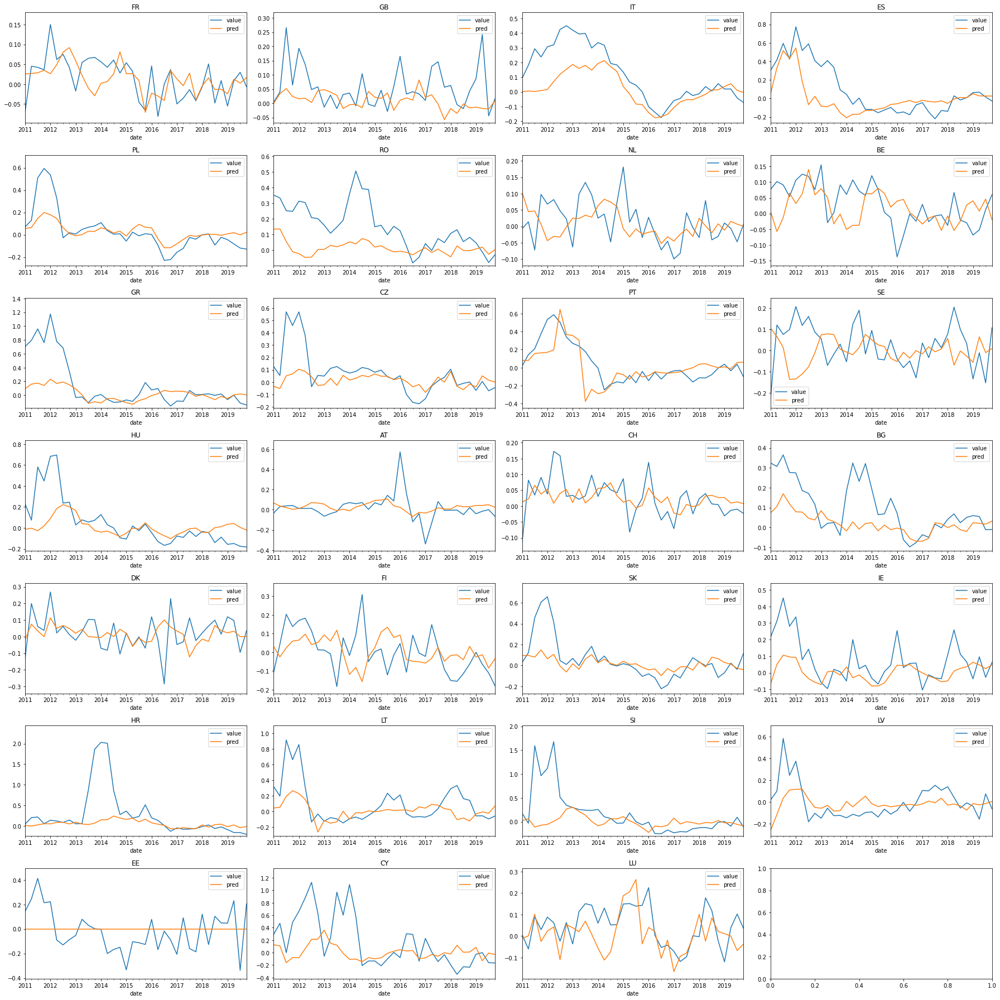

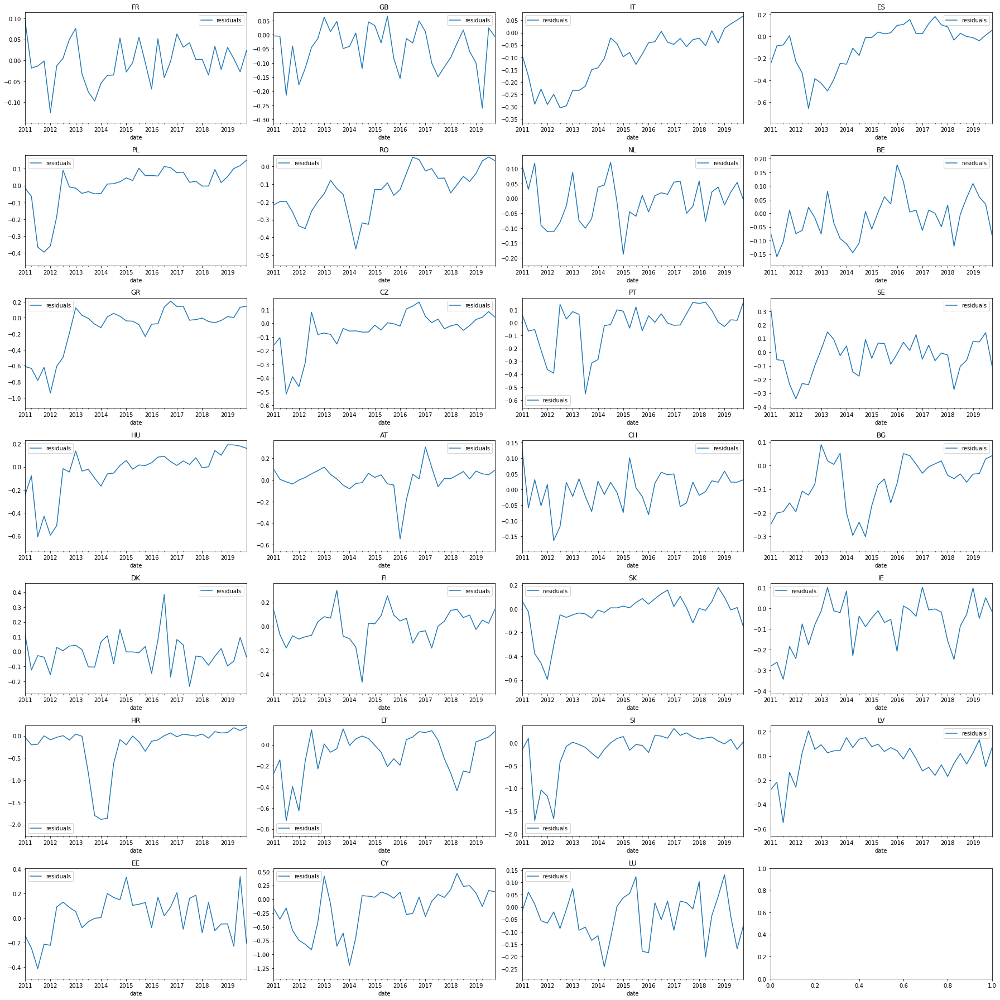

In [12]:
features = (
    [k + "_1" for k in keyword_ids]
    + [k + "_2" for k in keyword_ids]
    + [k + "_3" for k in keyword_ids]
    + [k + "_4" for k in keyword_ids]
)

# reg = linear_model.Lasso(positive=True, normalize=True, alpha=10.0)
reg_unfitted = linear_model.ElasticNet(normalize=False, fit_intercept=False)
# reg_unfitted = linear_model.LinearRegression()
params = {"alpha": [0.001, 0.01, 0.1, 1.0,], "l1_ratio": [0.5, 0.8, 0.9, 0.95]}
tuner = model_selection.GridSearchCV(
    reg_unfitted, params, scoring="neg_root_mean_squared_error"
)

tuner.fit(x_train[features], y_train)

display(pd.DataFrame(tuner.cv_results_).drop(columns="params"))
reg = tuner.best_estimator_

lasso_coefs = reg.coef_
print("ElasticNet Coefficients:")
print(pd.Series(lasso_coefs, features).sort_values(ascending=False).to_string())


cv_score = score_cv(reg, x_train[features], y_train)
display(cv_score)
print("Mean CV score:")
display(cv_score.mean())
print("OOS score:")
test_score = score_test(reg, x_test[features], y_test)
display(test_score)
fig, axs = plot_prediction(reg, x[features])
fig, axs = plot_residuals(reg, x[features])



### all keywords + ar(1), lasso

/home/stei509/anaconda3/envs/eumf/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/home/stei509/anaconda3/envs/eumf/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/home/stei509/anaconda3/envs/eumf/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.015573567253789, tolerance: 0.0030194394744712653
  model = cd_fast.enet_coordinate_descent(
/home/stei509/anaconda3/envs/eumf/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: UserWarning: With alpha=0, this algorith

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.146,4.143e-02,0.006,8.373e-04,0.0,-0.266,-0.167,-0.184,-0.129,-0.111,-0.171,0.054,8
1,0.011,2.337e-03,0.007,1.524e-03,0.0,-0.266,-0.167,-0.184,-0.129,-0.111,-0.171,0.054,7
2,0.010,6.574e-04,0.007,1.413e-03,0.0,-0.266,-0.167,-0.184,-0.128,-0.111,-0.171,0.054,6
3,0.010,8.214e-04,0.007,1.140e-03,0.0,-0.266,-0.167,-0.184,-0.127,-0.111,-0.171,0.054,5
4,0.008,1.005e-03,0.005,4.232e-04,0.001,-0.265,-0.166,-0.179,-0.117,-0.105,-0.166,0.057,3
5,0.008,1.039e-03,0.006,9.209e-04,0.01,-0.284,-0.162,-0.194,-0.105,-0.097,-0.168,0.068,4
6,0.009,2.025e-03,0.005,1.001e-03,0.002,-0.265,-0.167,-0.178,-0.112,-0.102,-0.165,0.058,2
7,0.009,1.275e-03,0.007,3.018e-03,0.005,-0.269,-0.166,-0.183,-0.105,-0.098,-0.164,0.062,1
8,0.012,3.825e-03,0.007,1.004e-03,0.1,-0.416,-0.244,-0.337,-0.124,-0.108,-0.246,0.119,9
9,0.013,3.921e-03,0.009,3.066e-03,0.2,-0.416,-0.244,-0.337,-0.124,-0.108,-0.246,0.119,9


LASSO Coefficients:
ar_1     0.688
19_1     0.027
21_2     0.019
19_3     0.012
12_1     0.011
11_4     0.009
43_4     0.008
24_1     0.006
20_1     0.003
28_1     0.003
58_4     0.003
21_4     0.003
121_3    0.000
60_3     0.000
52_3     0.000
54_3     0.000
55_3     0.000
56_3     0.000
57_3     0.000
58_3     0.000
59_3     0.000
113_3    0.000
112_3    0.000
119_3    0.000
114_3    0.000
51_3     0.000
117_3    0.000
118_3    0.000
123_3    0.000
122_3    0.000
115_3    0.000
44_3     0.000
49_3     0.000
48_3     0.000
15_3     0.000
16_3     0.000
17_3     0.000
18_3     0.000
20_3     0.000
21_3     0.000
22_3     0.000
24_3     0.000
26_3     0.000
28_3     0.000
32_3     0.000
33_3     0.000
37_3     0.000
38_3     0.000
39_3     0.000
41_3     0.000
42_3     0.000
43_3     0.000
125_3    0.000
124_3    0.000
14_4     0.000
2_4      0.000
10_4     0.000
51_4     0.000
52_4     0.000
54_4     0.000
55_4     0.000
56_4     0.000
57_4     0.000
59_4     0.000
60_4     0.000
112_4

,fit_time,score_time,test_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,test_r2
0,0.012,0.017,-8.489e+12,-0.269,0.232
1,0.020,0.022,-1.790e+00,-0.166,0.385
2,0.031,0.022,-1.711e+00,-0.183,0.680
3,0.012,0.023,-3.359e+00,-0.105,0.270
4,0.026,0.030,-2.965e+00,-0.098,0.022


Mean CV score:


fit_time                                   2.027e-02
score_time                                 2.293e-02
test_neg_mean_absolute_percentage_error   -1.698e+12
test_neg_root_mean_squared_error          -1.642e-01
test_r2                                    3.179e-01
dtype: float64

OOS score:


neg_mean_absolute_percentage_error   -1.793e+12
neg_root_mean_squared_error          -9.476e-02
r2                                    6.864e-02
dtype: float64

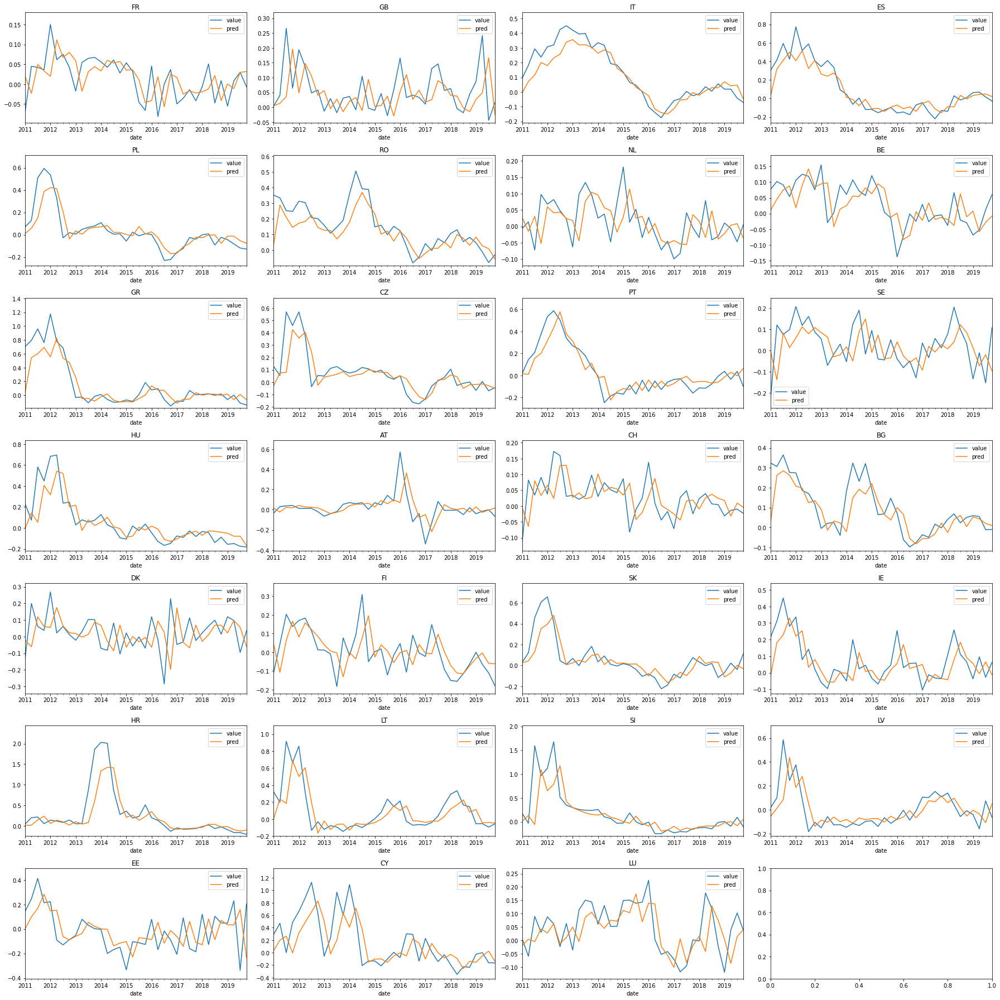

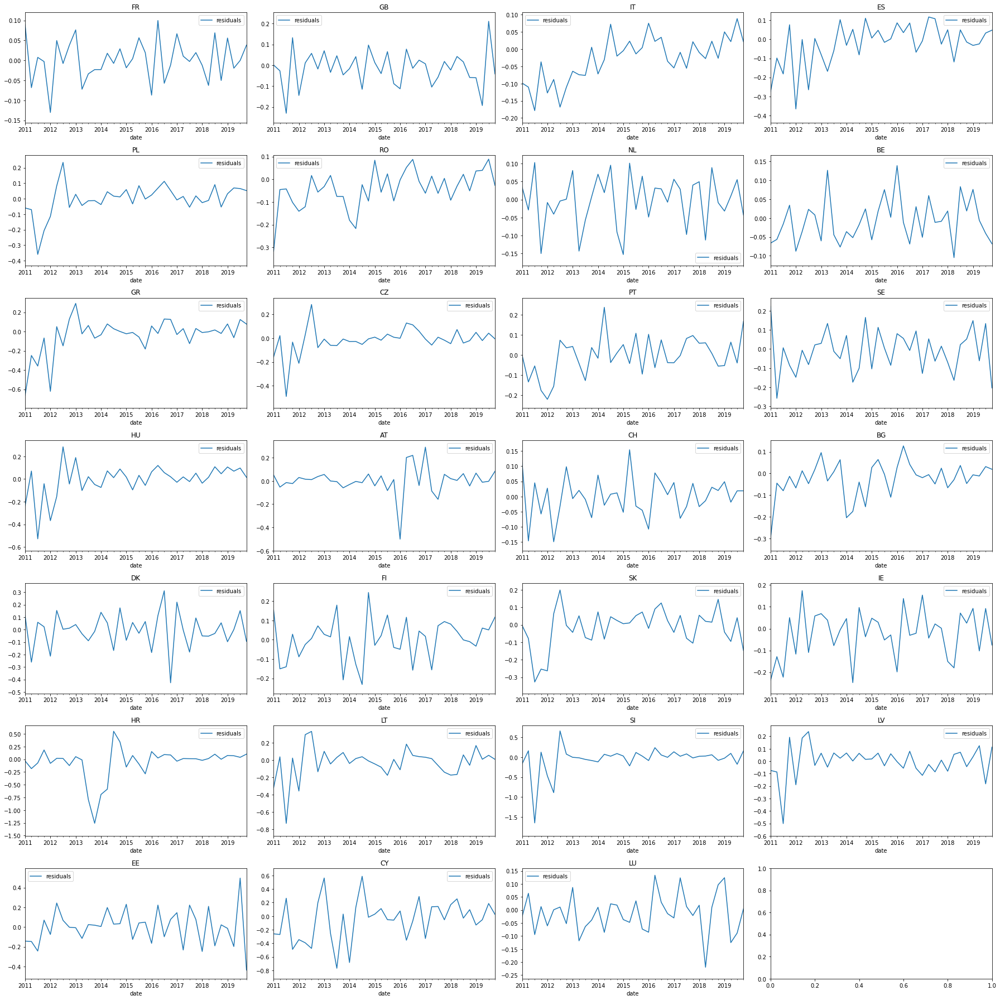

In [13]:
features = (
    ["ar_1"]
    + [k + "_1" for k in keyword_ids]
    + [k + "_2" for k in keyword_ids]
    + [k + "_3" for k in keyword_ids]
    + [k + "_4" for k in keyword_ids]
)

# reg = linear_model.Lasso(positive=True, normalize=True, alpha=10.0)
reg_unfitted = linear_model.Lasso(normalize=False, positive=True, fit_intercept=False)
# reg_unfitted = linear_model.LinearRegression()
params = {
    "alpha": [
        0.0,
        0.000001,
        0.00001,
        0.0001,
        0.001,
        0.01,
        0.002,
        0.005,
        0.1,
        0.2,
        0.5,
        1.0,
        2.0,
        5.0,
        10.0,
    ],
}
tuner = model_selection.GridSearchCV(
    reg_unfitted, params, scoring="neg_root_mean_squared_error"
)

tuner.fit(x_train[features], y_train)

display(pd.DataFrame(tuner.cv_results_).drop(columns="params"))
reg = tuner.best_estimator_

lasso_coefs = reg.coef_
print("LASSO Coefficients:")
print(pd.Series(lasso_coefs, features).sort_values(ascending=False).to_string())


cv_score = score_cv(reg, x_train[features], y_train)
display(cv_score)
print("Mean CV score:")
display(cv_score.mean())
print("OOS score:")
test_score = score_test(reg, x_test[features], y_test)
display(test_score)
fig, axs = plot_prediction(reg, x[features])
fig, axs = plot_residuals(reg, x[features])



### all keywords, random forest

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,6.538,0.696,0.018,0.003,-0.358,-0.194,-0.285,-0.115,-0.156,-0.222,0.088,1


,fit_time,score_time,test_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,test_r2
0,6.842,0.051,-4.094e+12,-0.356,-0.342
1,5.900,0.016,-2.214e+00,-0.182,0.262
2,5.357,0.016,-2.002e+00,-0.292,0.181
3,6.338,0.015,-2.342e+00,-0.120,0.052
4,6.374,0.015,-4.044e+00,-0.155,-1.458


Mean CV score:


fit_time                                   6.162e+00
score_time                                 2.268e-02
test_neg_mean_absolute_percentage_error   -8.189e+11
test_neg_root_mean_squared_error          -2.210e-01
test_r2                                   -2.608e-01
dtype: float64

OOS score:


neg_mean_absolute_percentage_error   -5.664e+11
neg_root_mean_squared_error          -1.261e-01
r2                                   -6.506e-01
dtype: float64

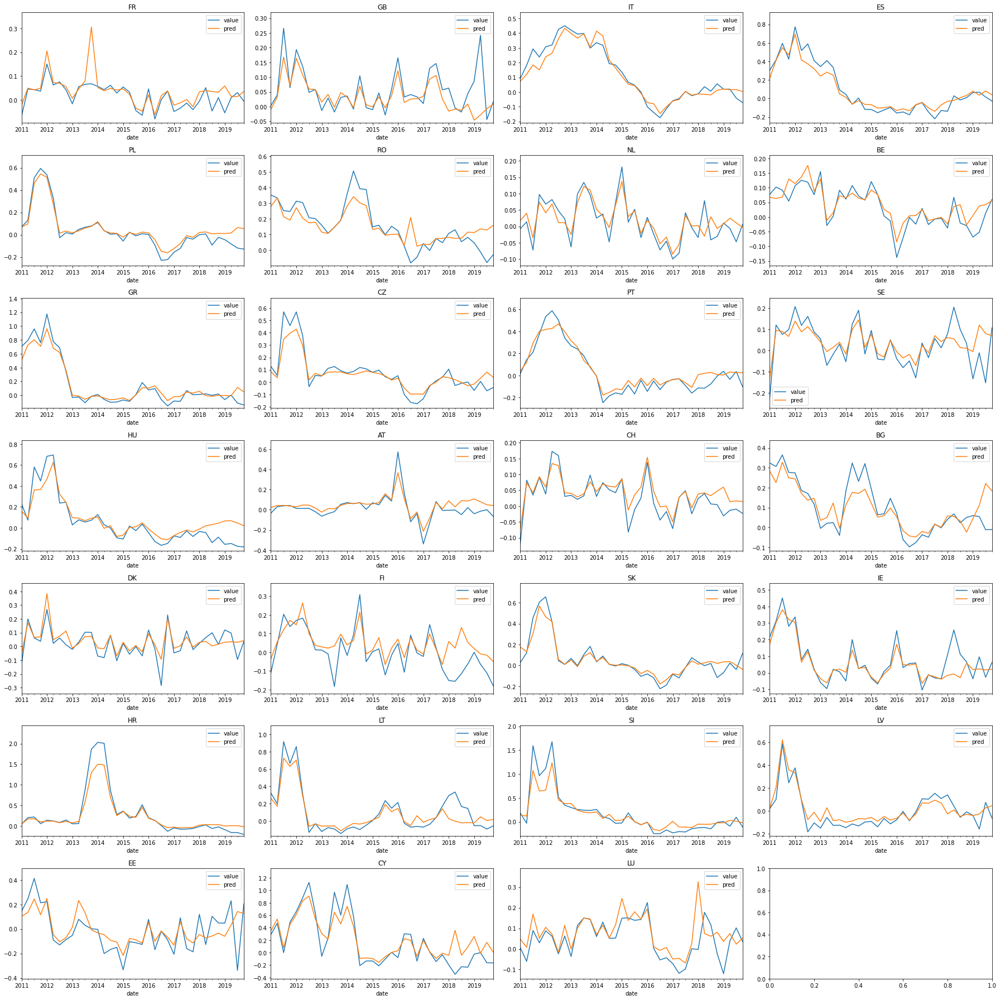

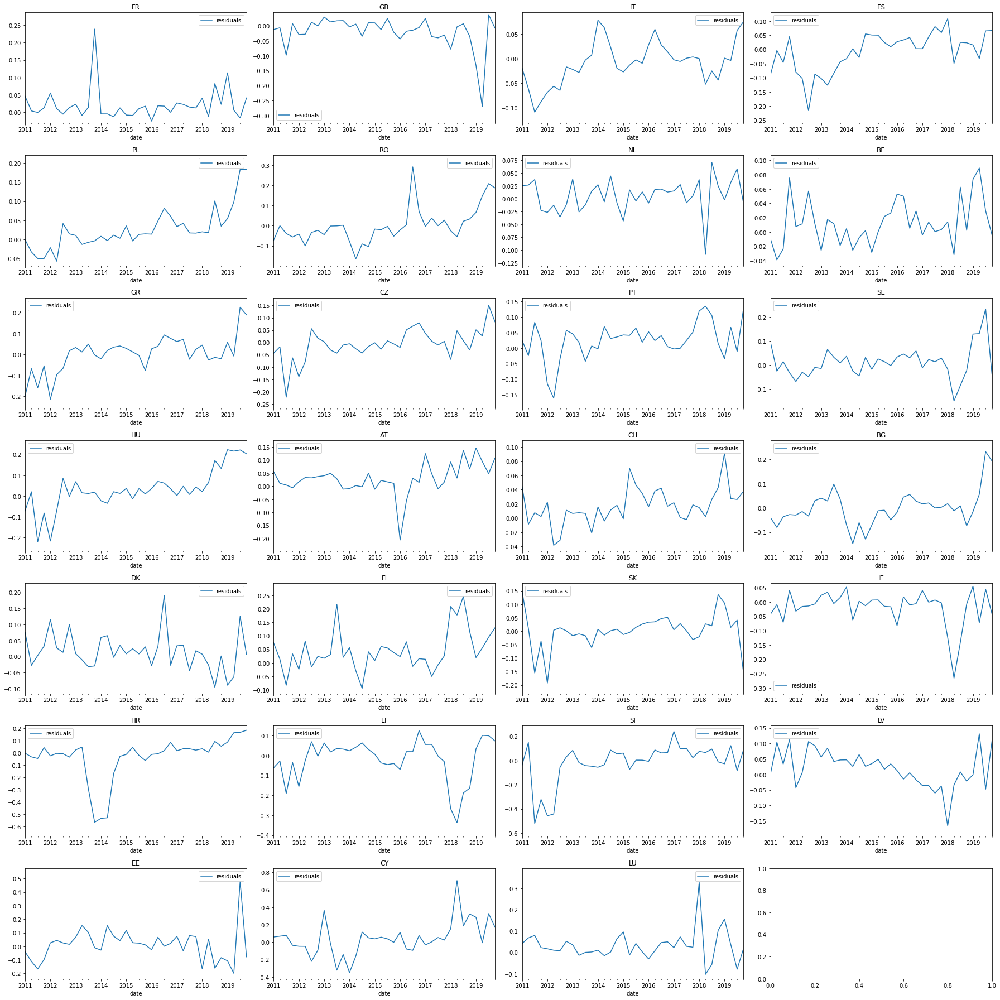

In [14]:
features = (
    dummy_cols
    + [k + "_1" for k in keyword_ids]
    + [k + "_2" for k in keyword_ids]
    + [k + "_3" for k in keyword_ids]
    + [k + "_4" for k in keyword_ids]
)

# reg = linear_model.Lasso(positive=True, normalize=True, alpha=10.0)
reg_unfitted = ensemble.RandomForestRegressor()
# reg_unfitted = linear_model.LinearRegression()
params = {}
tuner = model_selection.GridSearchCV(
    reg_unfitted, params, scoring="neg_root_mean_squared_error"
)

tuner.fit(x_train[features], y_train)

display(pd.DataFrame(tuner.cv_results_).drop(columns="params"))
reg = tuner.best_estimator_

# lasso_coefs = reg.coef_
# print("ElasticNet Coefficients:")
# print(pd.Series(lasso_coefs, features).sort_values(ascending=False).to_string())


cv_score = score_cv(reg, x_train[features], y_train)
display(cv_score)
print("Mean CV score:")
display(cv_score.mean())
print("OOS score:")
test_score = score_test(reg, x_test[features], y_test)
display(test_score)
fig, axs = plot_prediction(reg, x[features])
fig, axs = plot_residuals(reg, x[features])



### ar(1), mlp

/home/stei509/anaconda3/envs/eumf/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_mlpregressor__alpha,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.716,0.167,0.005,3.579e-04,0.1,-0.278,-0.203,-0.197,-0.153,-0.149,-0.196,0.047,3
1,1.138,0.147,0.006,1.111e-03,0.3,-0.299,-0.178,-0.196,-0.136,-0.120,-0.186,0.063,1
2,0.813,0.082,0.005,2.199e-03,1.0,-0.301,-0.159,-0.209,-0.125,-0.138,-0.187,0.064,2
3,0.708,0.033,0.004,5.664e-04,3.0,-0.368,-0.168,-0.279,-0.136,-0.158,-0.222,0.088,4
4,0.860,0.032,0.005,1.816e-03,10.0,-0.387,-0.212,-0.321,-0.154,-0.192,-0.253,0.087,5


,fit_time,score_time,test_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,test_r2
0,0.712,0.005,-1.058e+13,-0.291,0.104
1,0.988,0.006,-1.874e+00,-0.187,0.219
2,0.880,0.008,-3.758e+00,-0.198,0.624
3,0.896,0.007,-4.030e+00,-0.129,-0.102
4,0.887,0.007,-2.826e+00,-0.146,-1.160


Mean CV score:


fit_time                                   8.728e-01
score_time                                 6.735e-03
test_neg_mean_absolute_percentage_error   -2.117e+12
test_neg_root_mean_squared_error          -1.901e-01
test_r2                                   -6.306e-02
dtype: float64

OOS score:


neg_mean_absolute_percentage_error   -3.931e+12
neg_root_mean_squared_error          -1.128e-01
r2                                   -3.202e-01
dtype: float64

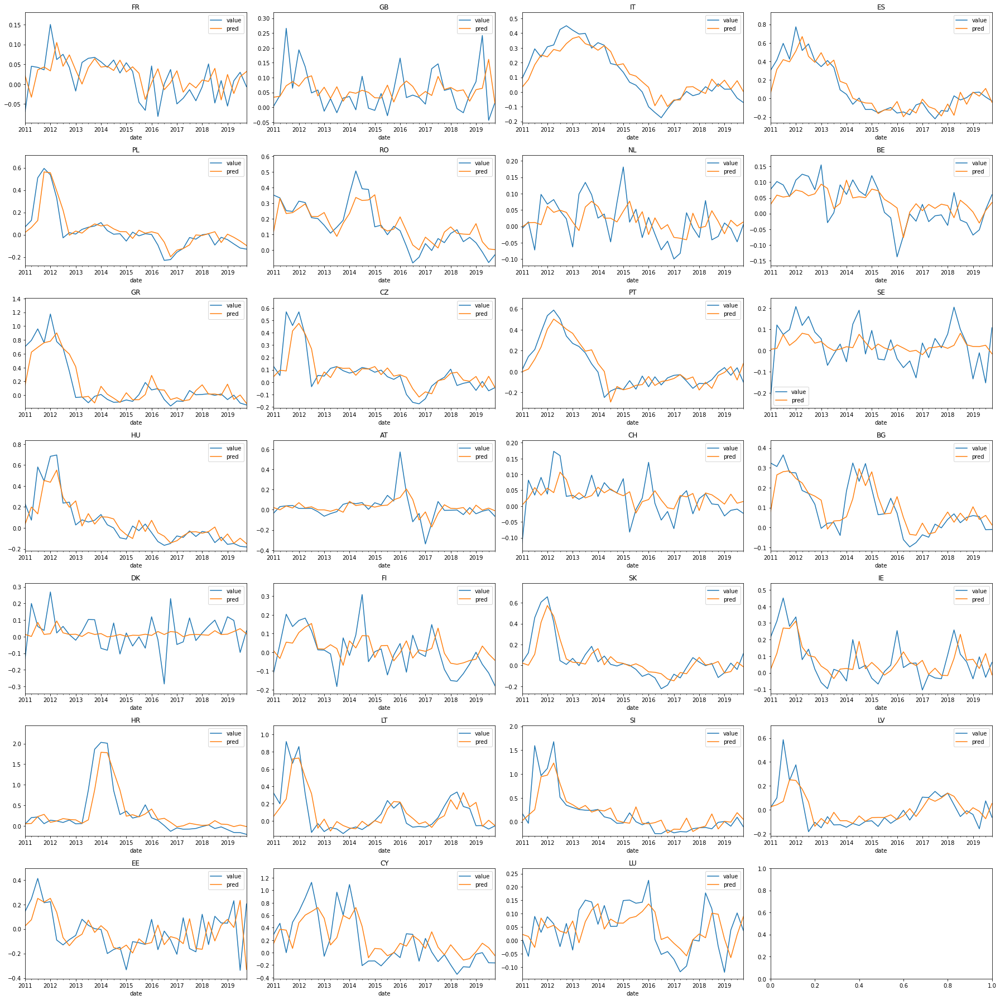

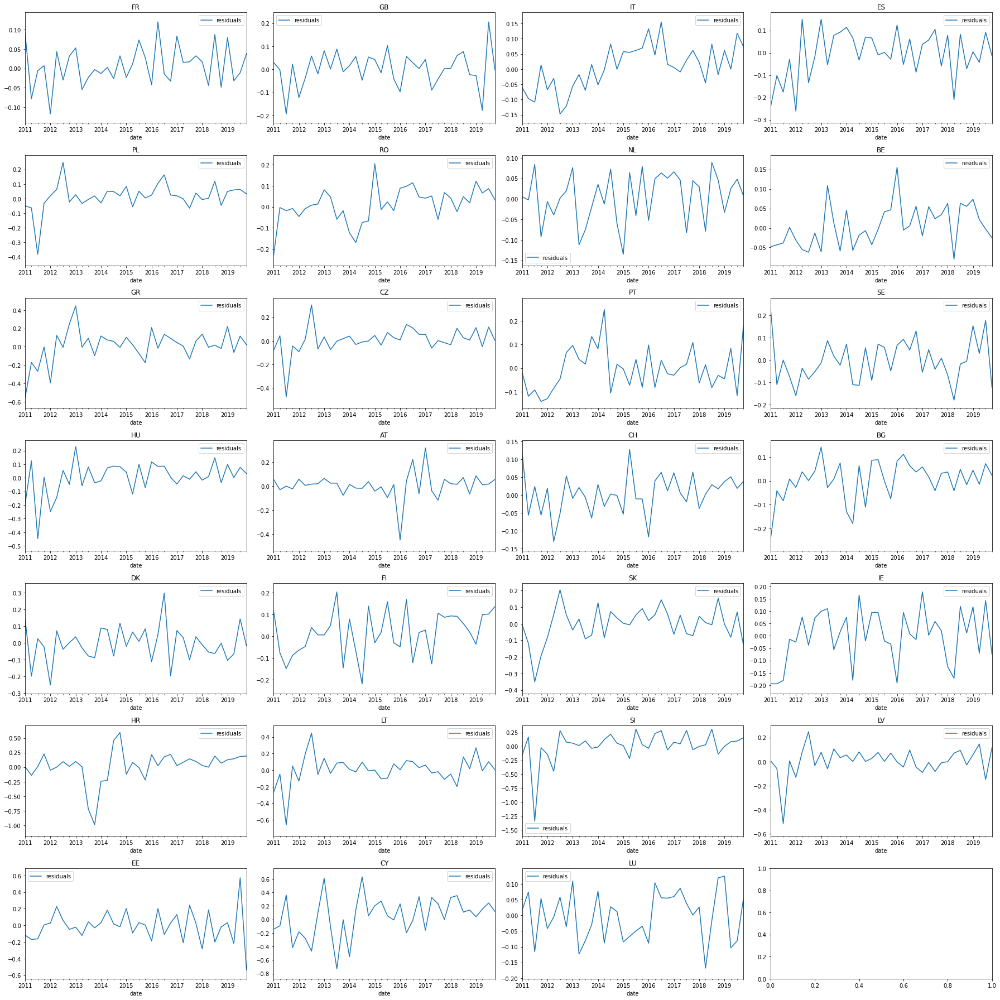

In [15]:
features = (
    dummy_cols
    + dummy_cols_month
    + ["ar_1"]
)

reg_unfitted = neural_network.MLPRegressor()
# reg_unfitted = linear_model.LinearRegression()
pipe = pipeline.make_pipeline(preprocessing.StandardScaler(), reg_unfitted)
params = {"mlpregressor__alpha": [0.1, 0.3, 1.0, 3.0, 10.0]}
tuner = model_selection.GridSearchCV(
    pipe, params, scoring="neg_root_mean_squared_error"
)

tuner.fit(x_train[features], y_train)

display(pd.DataFrame(tuner.cv_results_).drop(columns="params"))
reg = tuner.best_estimator_

# lasso_coefs = reg.coef_
# print("ElasticNet Coefficients:")
# print(pd.Series(lasso_coefs, features).sort_values(ascending=False).to_string())


cv_score = score_cv(reg, x_train[features], y_train)
display(cv_score)
print("Mean CV score:")
display(cv_score.mean())
print("OOS score:")
test_score = score_test(reg, x_test[features], y_test)
display(test_score)
fig, axs = plot_prediction(reg, x[features])
fig, axs = plot_residuals(reg, x[features])



### all keywords, mlp

/home/stei509/anaconda3/envs/eumf/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/stei509/anaconda3/envs/eumf/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/stei509/anaconda3/envs/eumf/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_mlpregressor__alpha,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,2.472,0.490,0.010,0.005,0.1,-0.354,-0.252,-0.299,-0.394,-0.285,-0.317,0.051,5
1,2.598,0.475,0.010,0.002,0.3,-0.315,-0.212,-0.213,-0.169,-0.166,-0.215,0.054,3
2,2.136,0.427,0.014,0.008,1.0,-0.322,-0.153,-0.224,-0.139,-0.165,-0.201,0.067,1
3,1.644,0.292,0.007,0.001,3.0,-0.327,-0.156,-0.274,-0.132,-0.147,-0.207,0.078,2
4,1.491,0.264,0.009,0.002,10.0,-0.374,-0.190,-0.312,-0.150,-0.188,-0.243,0.085,4


,fit_time,score_time,test_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,test_r2
0,2.449,0.010,-1.715e+12,-0.298,0.060
1,2.083,0.015,-2.312e+00,-0.158,0.446
2,2.614,0.019,-2.895e+00,-0.220,0.535
3,2.879,0.013,-8.053e+00,-0.137,-0.242
4,1.961,0.007,-3.948e+00,-0.135,-0.848


Mean CV score:


fit_time                                   2.397e+00
score_time                                 1.254e-02
test_neg_mean_absolute_percentage_error   -3.430e+11
test_neg_root_mean_squared_error          -1.895e-01
test_r2                                   -9.661e-03
dtype: float64

OOS score:


neg_mean_absolute_percentage_error   -2.101e+12
neg_root_mean_squared_error          -1.518e-01
r2                                   -1.390e+00
dtype: float64

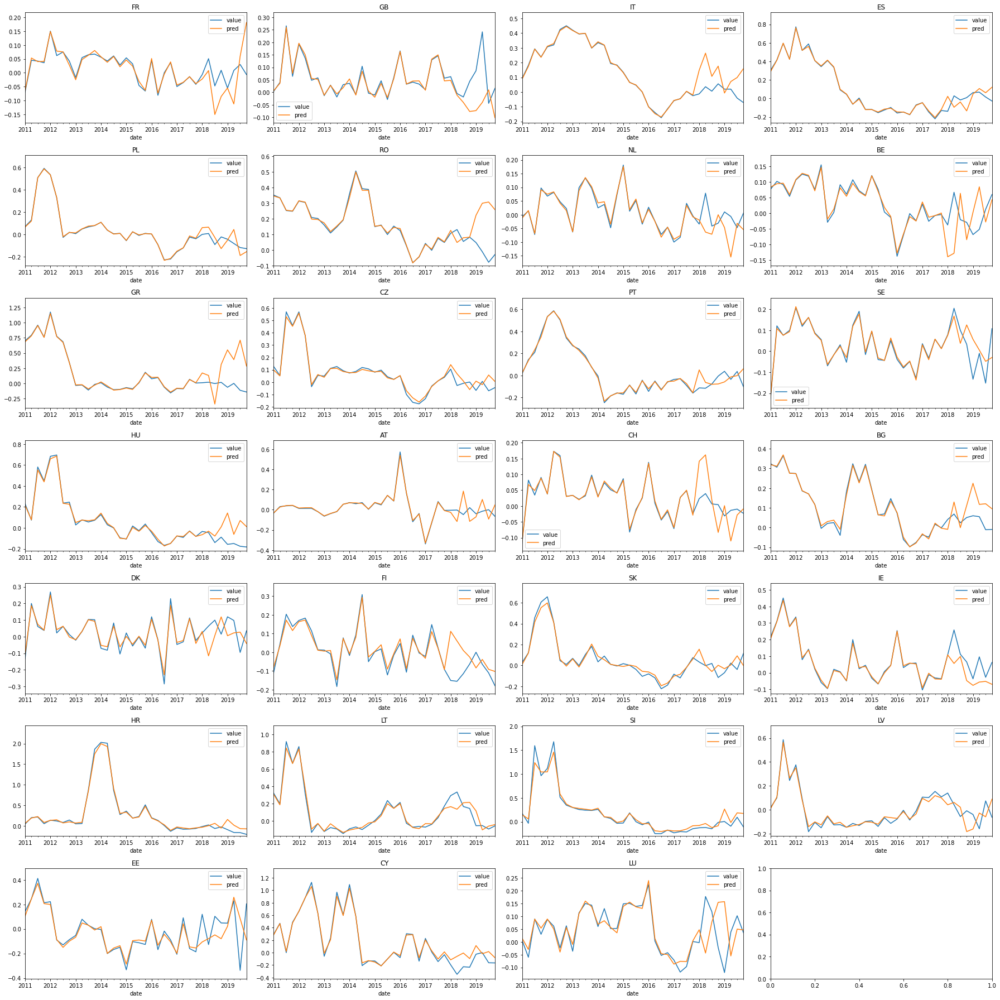

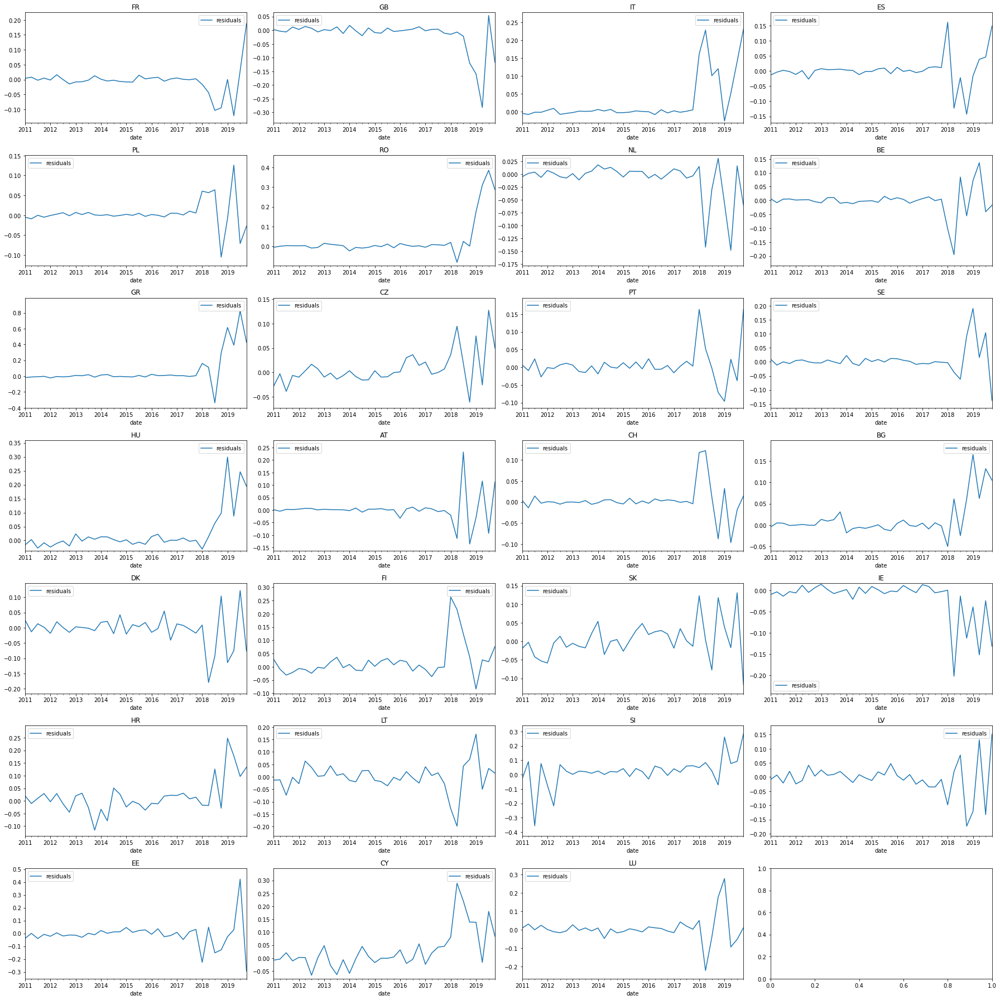

In [16]:
features = (
    dummy_cols
    + dummy_cols_month
    + ["ar_1"]
    # + ["19_1", "19_2", "19_3", "19_4"]
    + [k + "_1" for k in keyword_ids]
    + [k + "_2" for k in keyword_ids]
    + [k + "_3" for k in keyword_ids]
    + [k + "_4" for k in keyword_ids]
)

reg_unfitted = neural_network.MLPRegressor(alpha=1.0)
# reg_unfitted = linear_model.LinearRegression()
pipe = pipeline.make_pipeline(preprocessing.StandardScaler(), reg_unfitted)
params = {
    "mlpregressor__alpha": [0.1, 0.3, 1.0, 3.0, 10.0],
}
tuner = model_selection.GridSearchCV(
    pipe, params, scoring="neg_root_mean_squared_error"
)

tuner.fit(x_train[features], y_train)

display(pd.DataFrame(tuner.cv_results_).drop(columns="params"))
reg = tuner.best_estimator_

# lasso_coefs = reg.coef_
# print("ElasticNet Coefficients:")
# print(pd.Series(lasso_coefs, features).sort_values(ascending=False).to_string())


cv_score = score_cv(reg, x_train[features], y_train)
display(cv_score)
print("Mean CV score:")
display(cv_score.mean())
print("OOS score:")
test_score = score_test(reg, x_test[features], y_test)
display(test_score)
fig, axs = plot_prediction(reg, x[features])
fig, axs = plot_residuals(reg, x[features])



,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_mlpregressor__alpha,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,1.027,0.118,0.007,1.694e-03,0.1,-0.314,-0.191,-0.202,-0.147,-0.184,-0.207,0.056,3
1,1.414,0.244,0.008,2.966e-03,0.3,-0.281,-0.179,-0.204,-0.131,-0.132,-0.185,0.055,1
2,0.829,0.038,0.005,1.839e-03,1.0,-0.303,-0.157,-0.202,-0.129,-0.151,-0.188,0.062,2
3,0.848,0.074,0.005,7.334e-04,3.0,-0.366,-0.170,-0.275,-0.144,-0.160,-0.223,0.085,4
4,0.967,0.037,0.006,2.317e-03,10.0,-0.375,-0.214,-0.318,-0.167,-0.179,-0.251,0.082,5


,fit_time,score_time,test_neg_mean_absolute_percentage_error,test_neg_root_mean_squared_error,test_r2
0,0.780,0.005,-9.110e+12,-0.286,0.136
1,1.116,0.012,-2.191e+00,-0.174,0.324
2,1.306,0.024,-2.460e+00,-0.195,0.635
3,1.671,0.008,-7.002e+00,-0.137,-0.242
4,1.322,0.005,-3.509e+00,-0.147,-1.215


Mean CV score:


fit_time                                   1.239e+00
score_time                                 1.075e-02
test_neg_mean_absolute_percentage_error   -1.822e+12
test_neg_root_mean_squared_error          -1.879e-01
test_r2                                   -7.251e-02
dtype: float64

OOS score:


neg_mean_absolute_percentage_error   -3.208e+12
neg_root_mean_squared_error          -1.055e-01
r2                                   -1.544e-01
dtype: float64

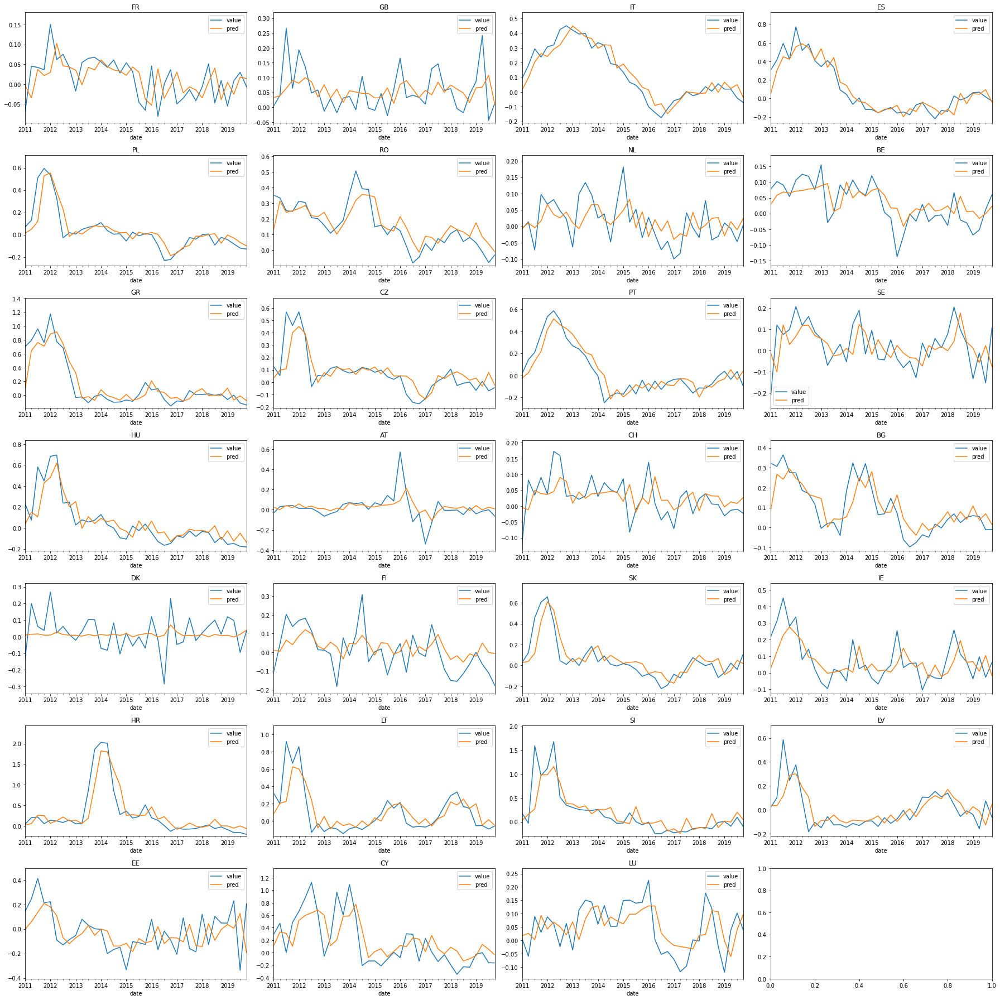

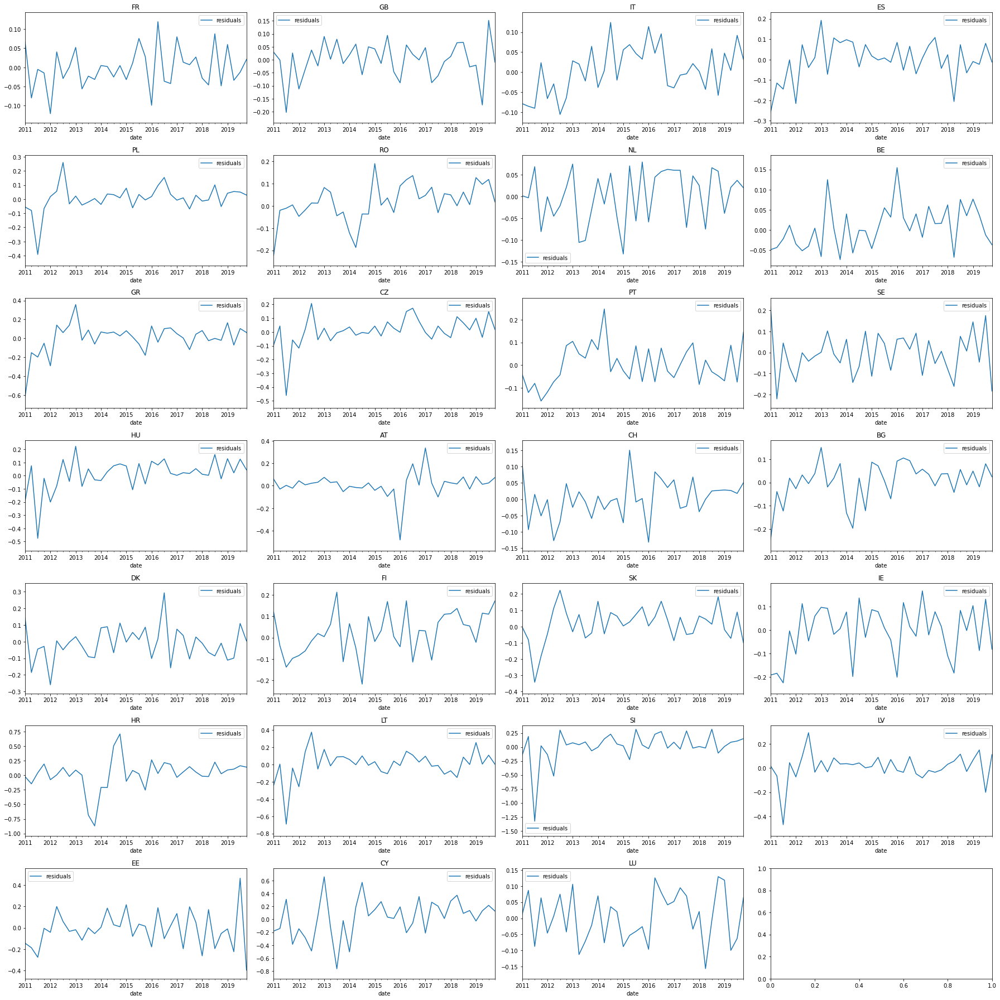

In [17]:
features = (
    dummy_cols
    + dummy_cols_month
    + ["ar_1"]
    # + ["19_1", "19_2", "19_3", "19_4"]
    # + [k + "_1" for k in keyword_ids]
    # + [k + "_2" for k in keyword_ids]
    # + [k + "_3" for k in keyword_ids]
    # + [k + "_4" for k in keyword_ids]
)

reg_unfitted = neural_network.MLPRegressor(alpha=1.0)
# reg_unfitted = linear_model.LinearRegression()
pipe = pipeline.make_pipeline(preprocessing.StandardScaler(), reg_unfitted)
params = {
    "mlpregressor__alpha": [0.1, 0.3, 1.0, 3.0, 10.0],
}
tuner = model_selection.GridSearchCV(
    pipe, params, scoring="neg_root_mean_squared_error"
)

tuner.fit(x_train[features], y_train)

display(pd.DataFrame(tuner.cv_results_).drop(columns="params"))
reg = tuner.best_estimator_

# lasso_coefs = reg.coef_
# print("ElasticNet Coefficients:")
# print(pd.Series(lasso_coefs, features).sort_values(ascending=False).to_string())


cv_score = score_cv(reg, x_train[features], y_train)
display(cv_score)
print("Mean CV score:")
display(cv_score.mean())
print("OOS score:")
test_score = score_test(reg, x_test[features], y_test)
display(test_score)
fig, axs = plot_prediction(reg, x[features])
fig, axs = plot_residuals(reg, x[features])

